In [7]:
#IMPORT SECTION
import sys,os,time,glob,scipy
import obspy
import pyasdf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from seisgo import noise, monitoring, utils
import seisgo.plotting as sp
from seisgo.stacking import seisstack
import matplotlib.dates as mdates
import seisgo.downloaders as dld
import pickle

In [8]:
# GREAT SITKIN ISLAND
#####FILE LOCATIONS#####
rootpath = "/depot/xtyang/data/projects/volcanodvv" # roothpath for the project
maindirec  = os.path.join(rootpath,'data_greatsitkin') #main project folder
direc  = os.path.join(rootpath,'data_greatsitkin/MERGED_PAIRS_all_sta')
figdir = os.path.join('Figures')
dvvdir  = os.path.join(maindirec,'dvv_5sta_redo')
if not os.path.isdir(dvvdir):os.makedirs(dvvdir)

######SET PARAMTERS######
save = True                                 #Save?
format = 'png'                              #save format
allfreq = True
onelag = True                               #Make Measurement one lag or two
norm_flag = True                            #Whether to normalize the cross-correlation waveforms
vmin = 1                                    #minimum velocity of the direct waves ->  #start of the coda waveforms
nproc=20                                      #number of processors to use.
stack_method = 'robust'                     #which stacked data to measure dispersion info
Method = 'ts'
freqlst = [[1,2]]#[[0.4,1],[2,3]]#[[1,2]]                              #frequency

#####STATION#####
sta_list = ['AV.GSSP','AV.GSCK','AV.GSMY','AV.GSTD','AV.GSTR']
cc_complist = ['EE','NN','ZZ','EZ','EN','NZ']             #Which components to use (EZ, EN, NZ)

sdate="2019_07_01"
edate="2023_07_31"
sdateref="2019_07_05"
edateref="2020_02_01"

In [9]:
##############TEST PARAMETERS###########
offsets = list(np.arange(2,50,5))
window_factor=10 #scale the length by the longest period.
winlen = [12]#list(np.arange(5,21,1))
print(offsets)
print((winlen))

variable_paramter = winlen

[2, 7, 12, 17, 22, 27, 32, 37, 42, 47]
[12]


Timer on!

5811
5811


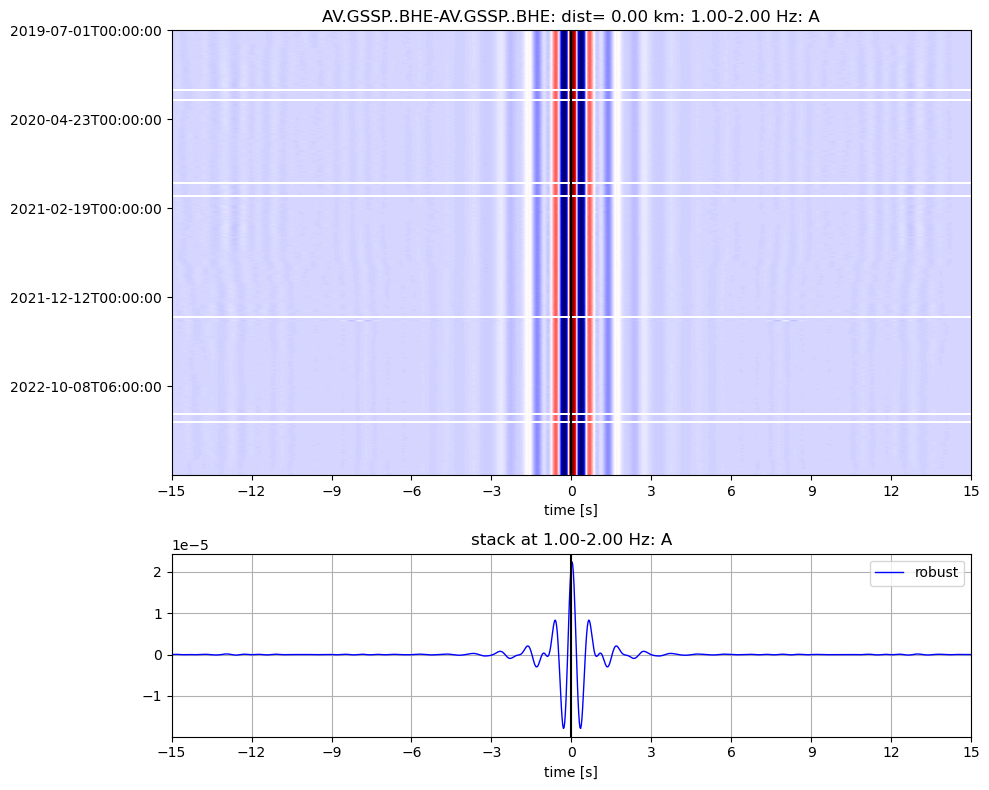

saving as: dvv.AV.GSSP.AV.GSSP.EE.redo.1-2Hz.ts.pk
working on 2901 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.EE.redo.1-2Hz.ts.pk


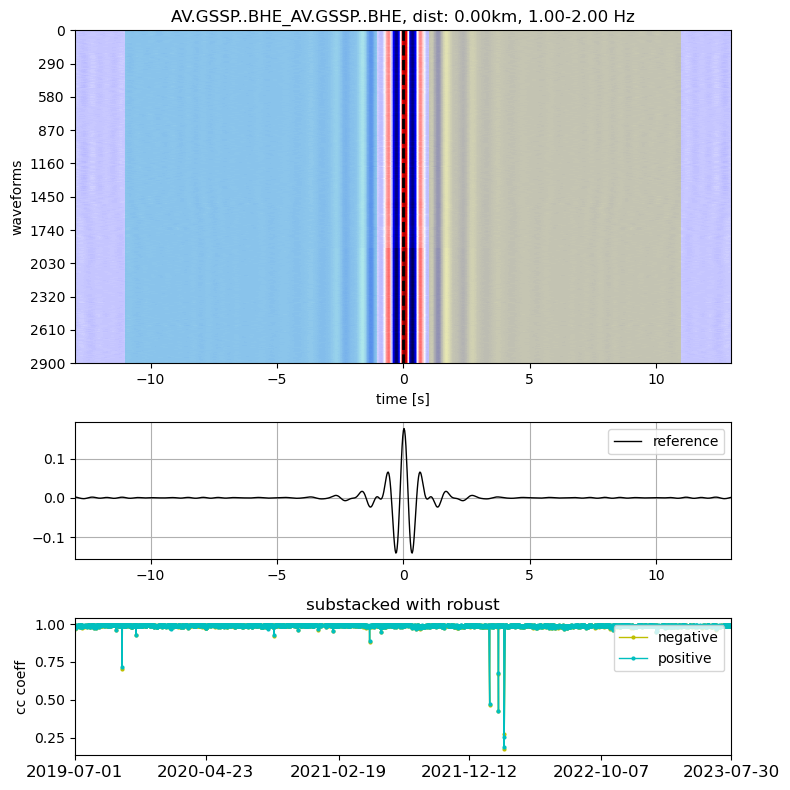

with 20 processors, took 15.282775 seconds
5798
5798


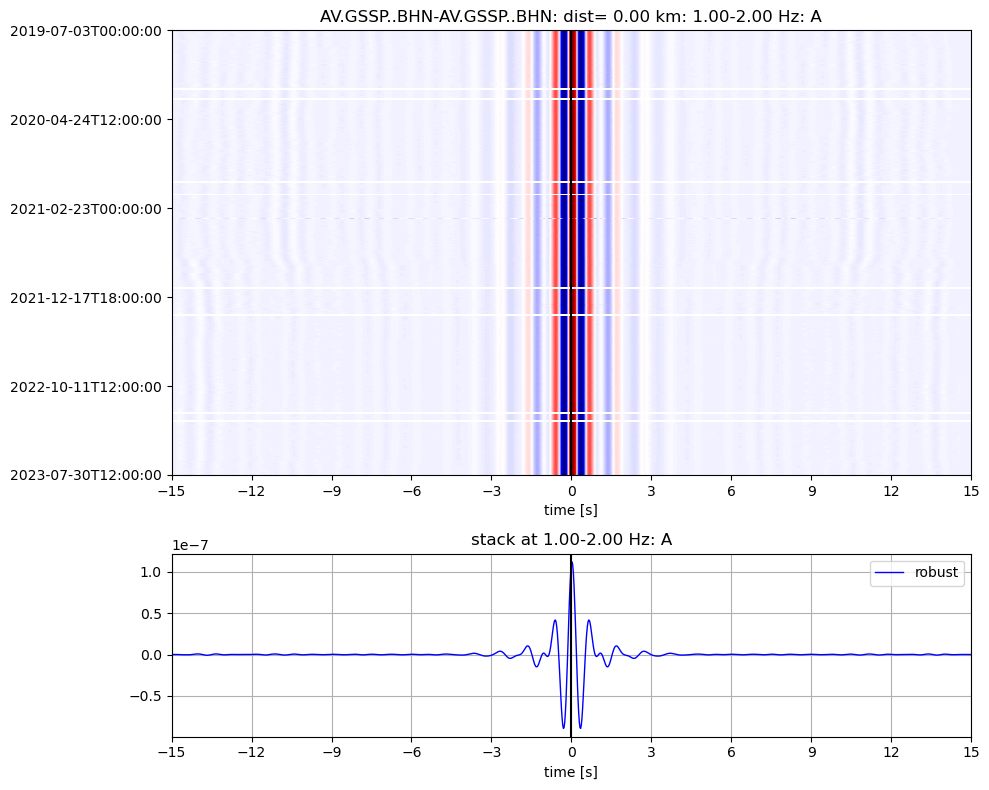

saving as: dvv.AV.GSSP.AV.GSSP.NN.redo.1-2Hz.ts.pk
working on 2897 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.NN.redo.1-2Hz.ts.pk


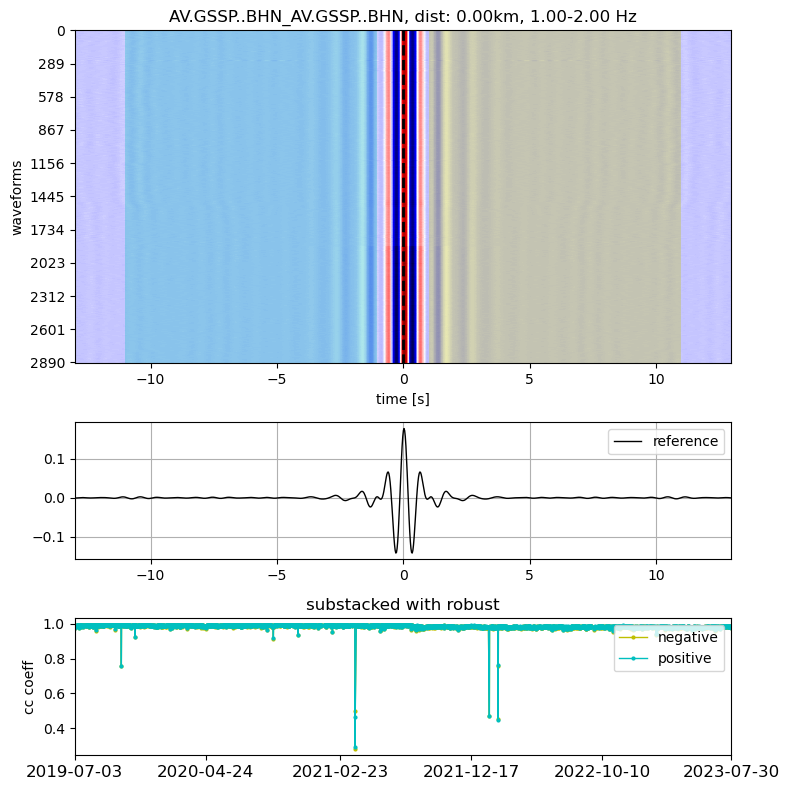

with 20 processors, took 15.776249 seconds
5770
5770


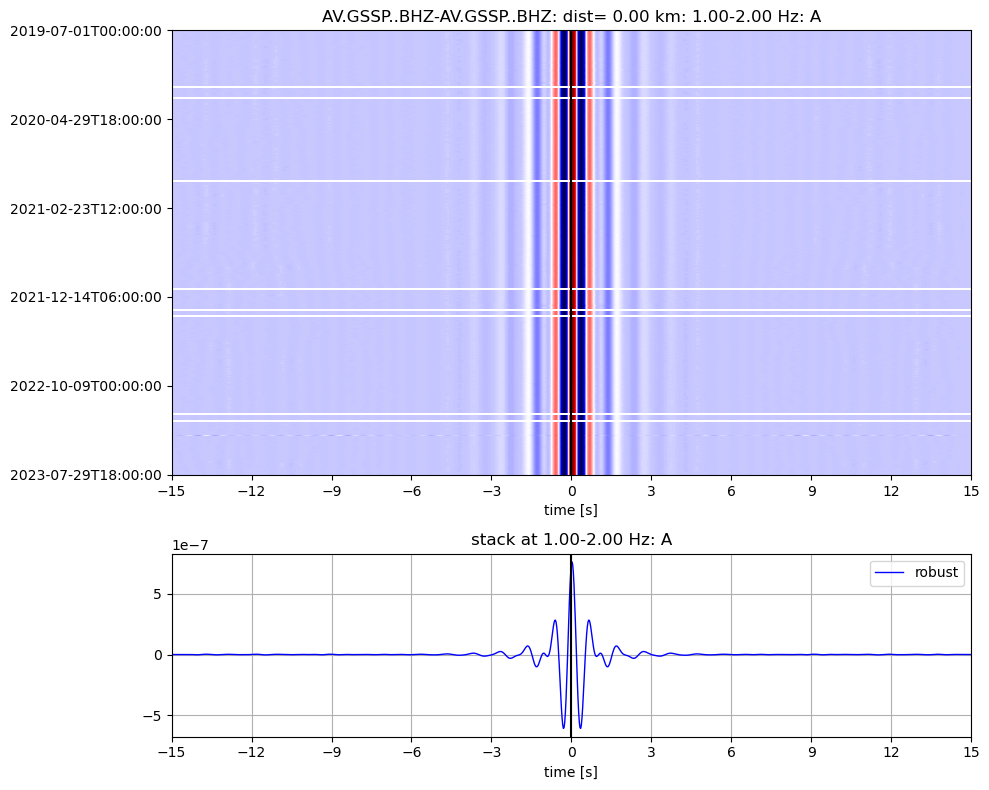

saving as: dvv.AV.GSSP.AV.GSSP.ZZ.redo.1-2Hz.ts.pk
working on 2881 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.ZZ.redo.1-2Hz.ts.pk


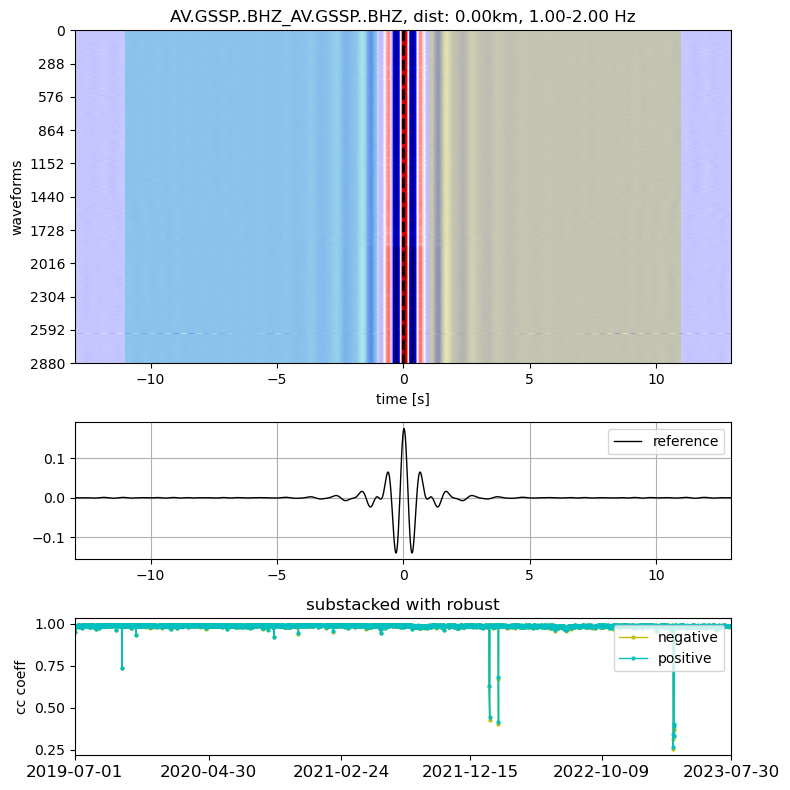

with 20 processors, took 15.192613 seconds
5657
5657


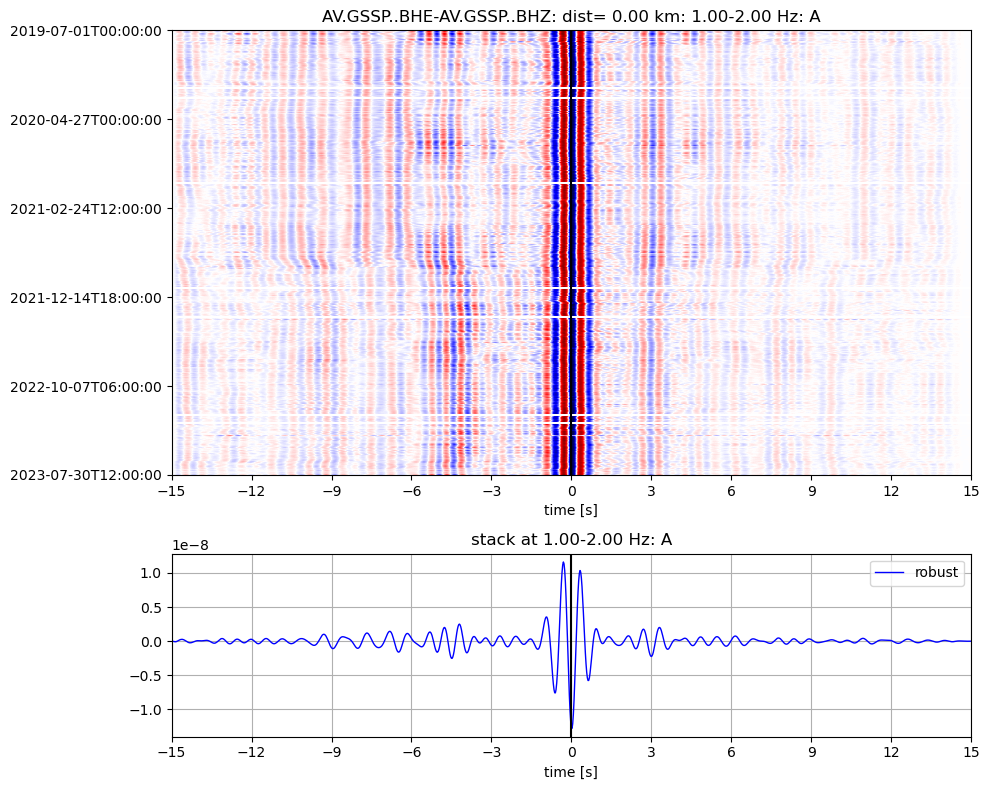

saving as: dvv.AV.GSSP.AV.GSSP.EZ.redo.1-2Hz.ts.pk
working on 2823 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.EZ.redo.1-2Hz.ts.pk


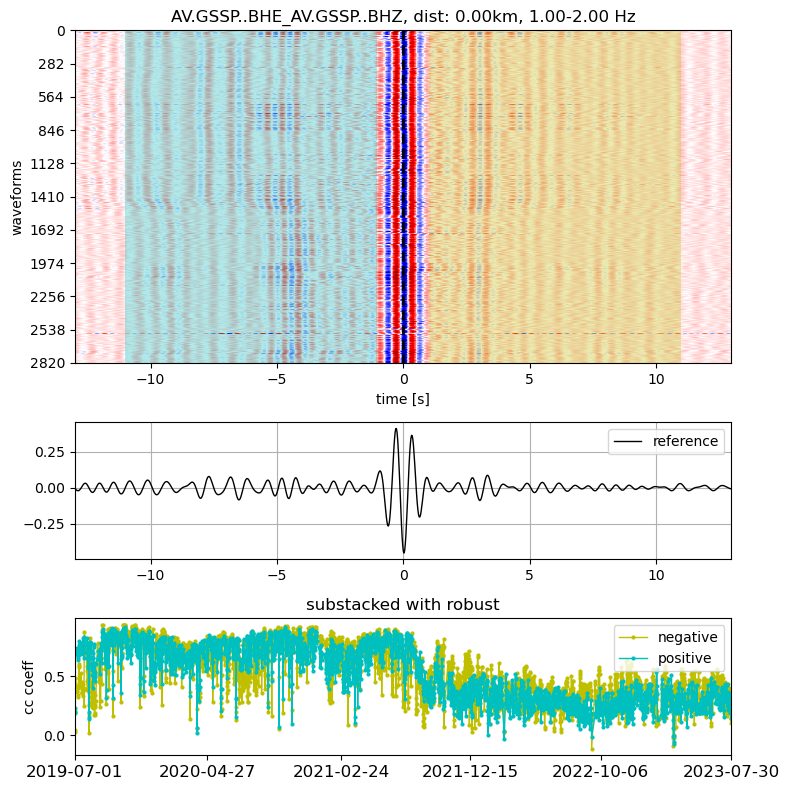

with 20 processors, took 15.856467 seconds
5686
5686


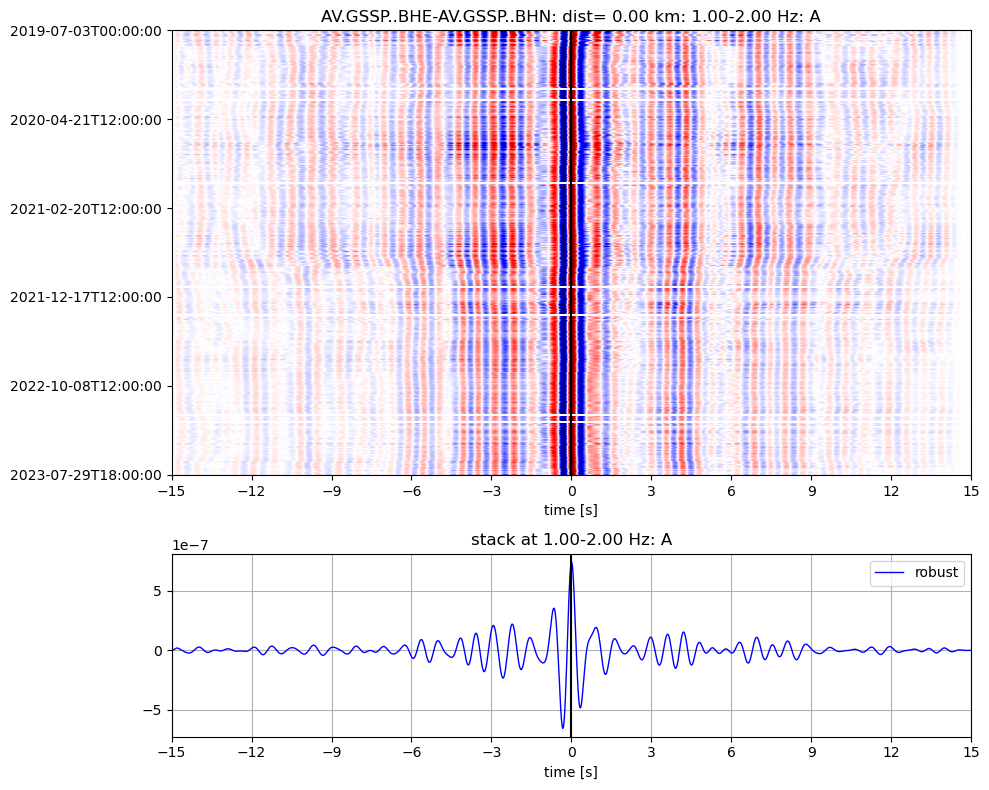

saving as: dvv.AV.GSSP.AV.GSSP.EN.redo.1-2Hz.ts.pk
working on 2840 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.EN.redo.1-2Hz.ts.pk


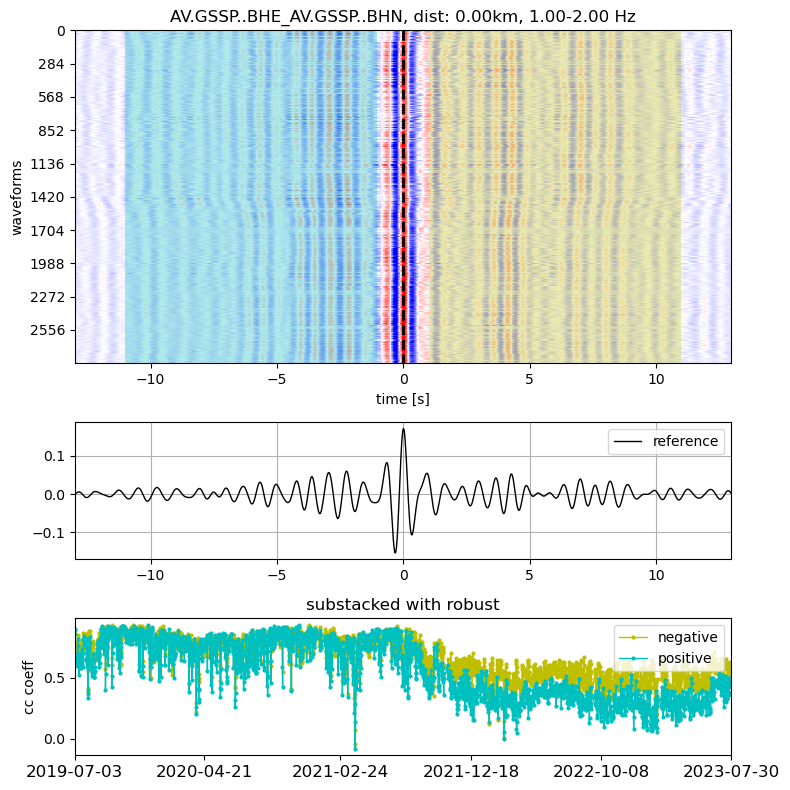

with 20 processors, took 14.774519 seconds
5644
5644


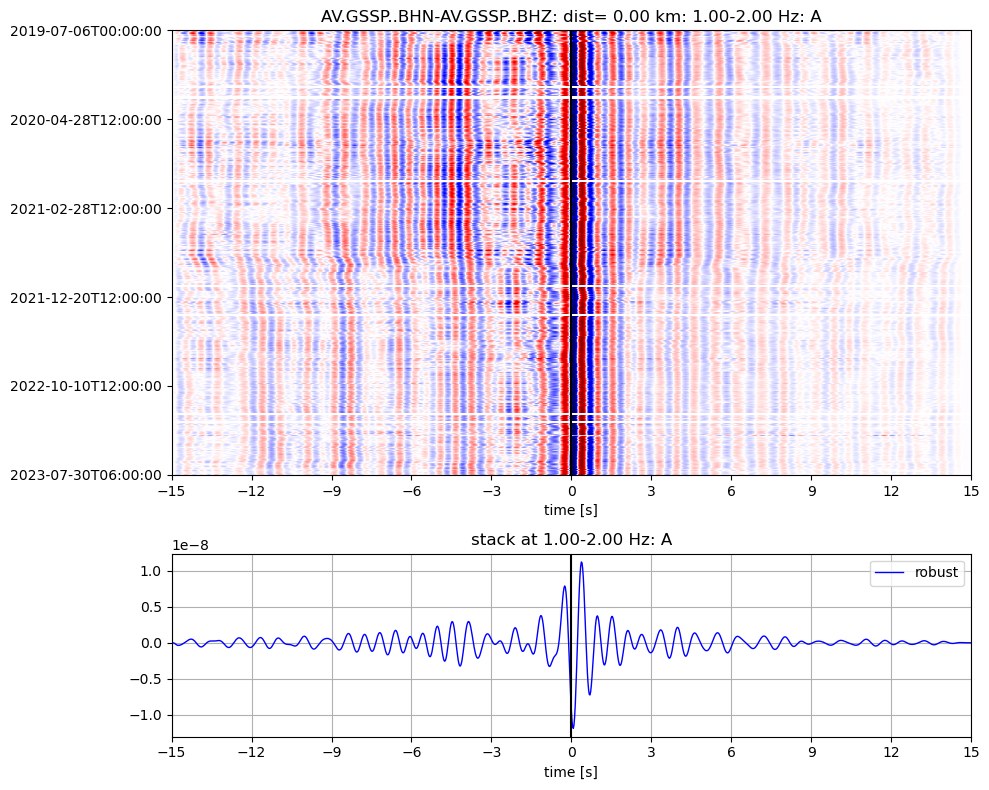

saving as: dvv.AV.GSSP.AV.GSSP.NZ.redo.1-2Hz.ts.pk
working on 2819 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSSP.AV.GSSP.NZ.redo.1-2Hz.ts.pk


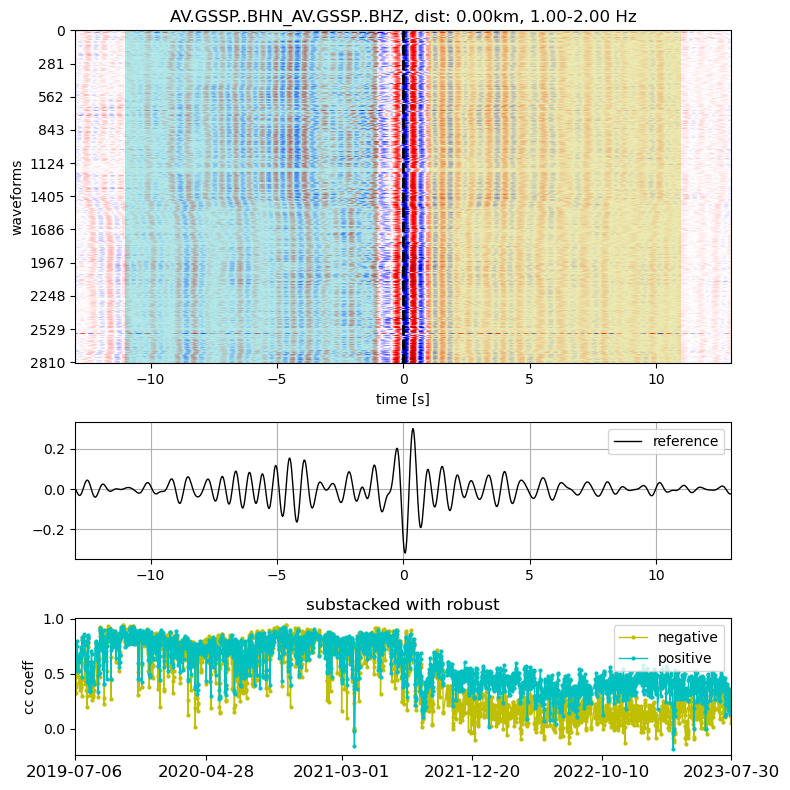

with 20 processors, took 15.158875 seconds
5716
5716


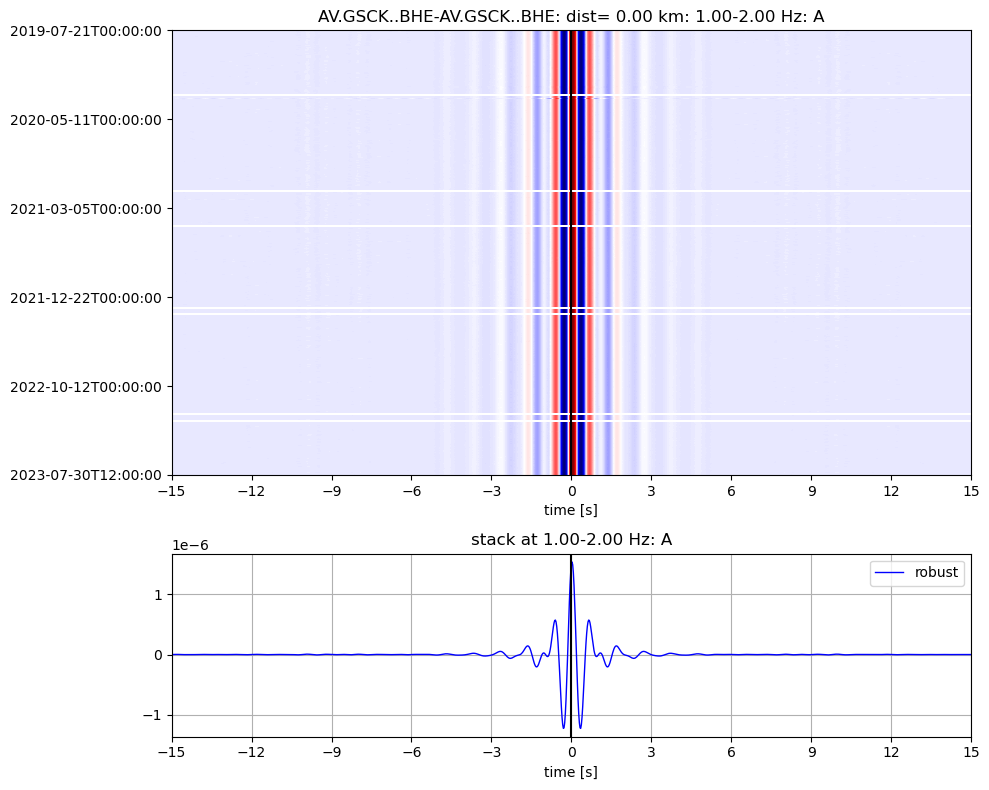

saving as: dvv.AV.GSCK.AV.GSCK.EE.redo.1-2Hz.ts.pk
working on 2862 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.EE.redo.1-2Hz.ts.pk


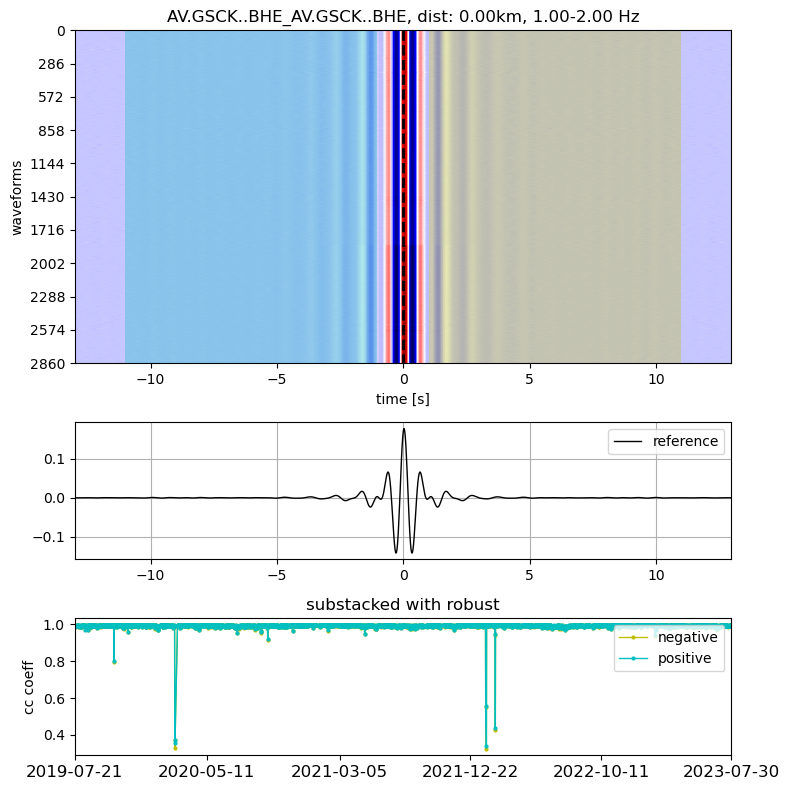

with 20 processors, took 14.283212 seconds
5674
5674


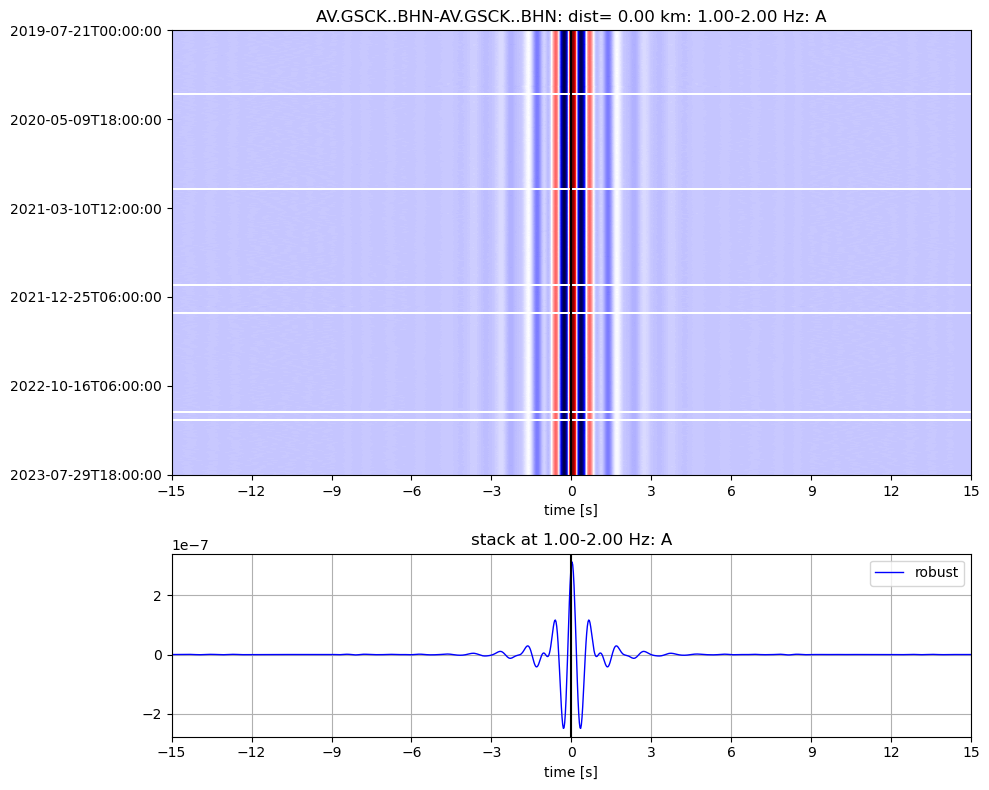

saving as: dvv.AV.GSCK.AV.GSCK.NN.redo.1-2Hz.ts.pk
working on 2841 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.NN.redo.1-2Hz.ts.pk


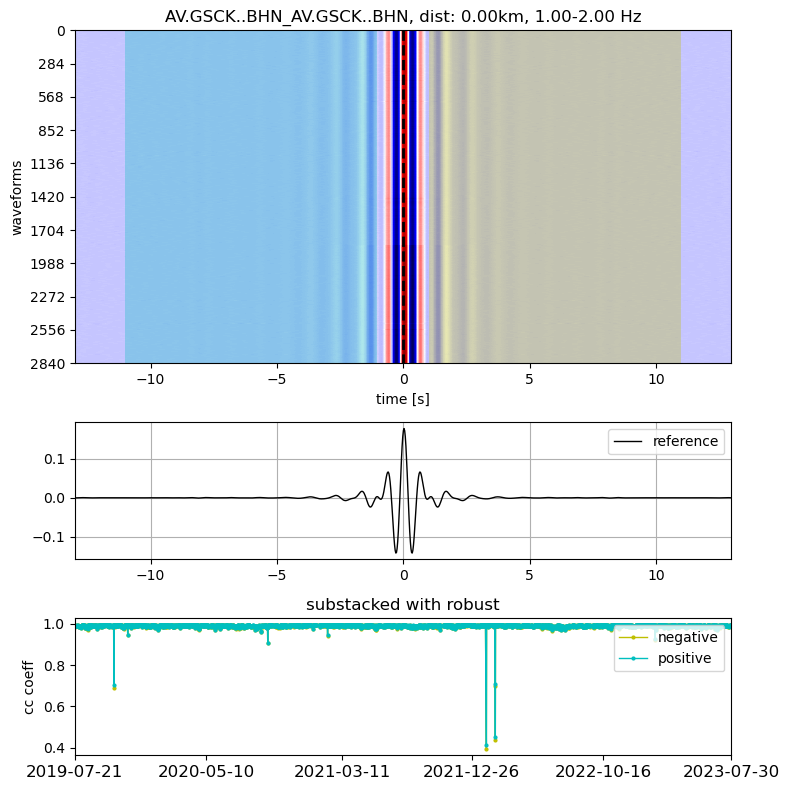

with 20 processors, took 15.032952 seconds
5674
5674


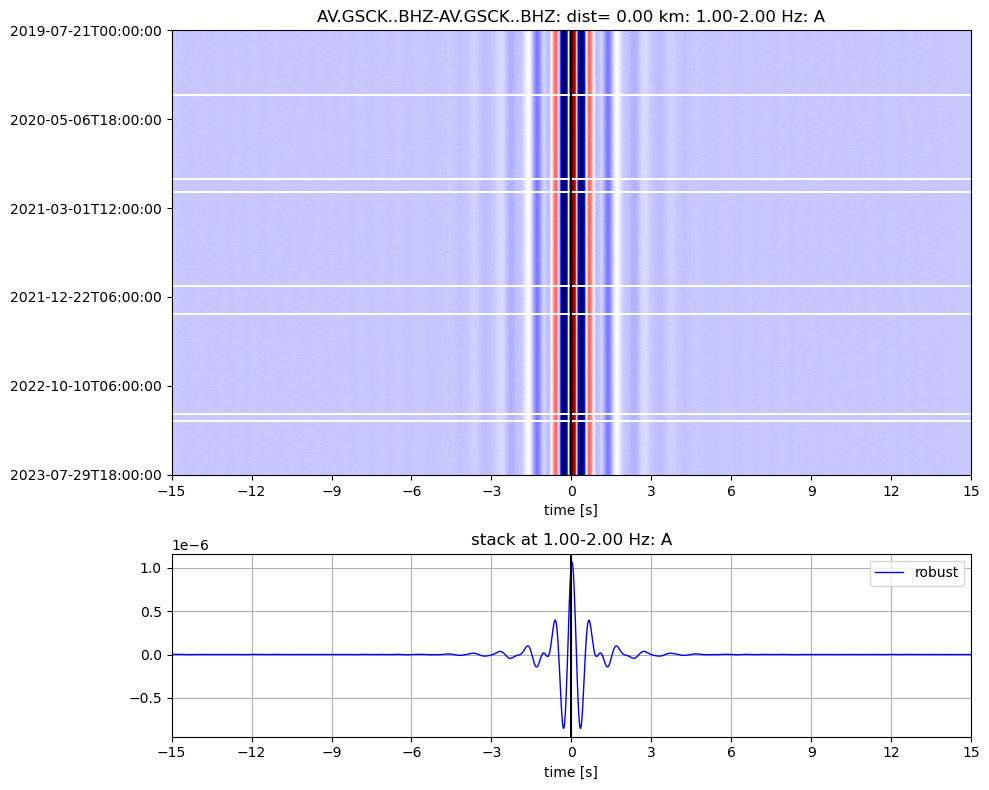

saving as: dvv.AV.GSCK.AV.GSCK.ZZ.redo.1-2Hz.ts.pk
working on 2841 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.ZZ.redo.1-2Hz.ts.pk


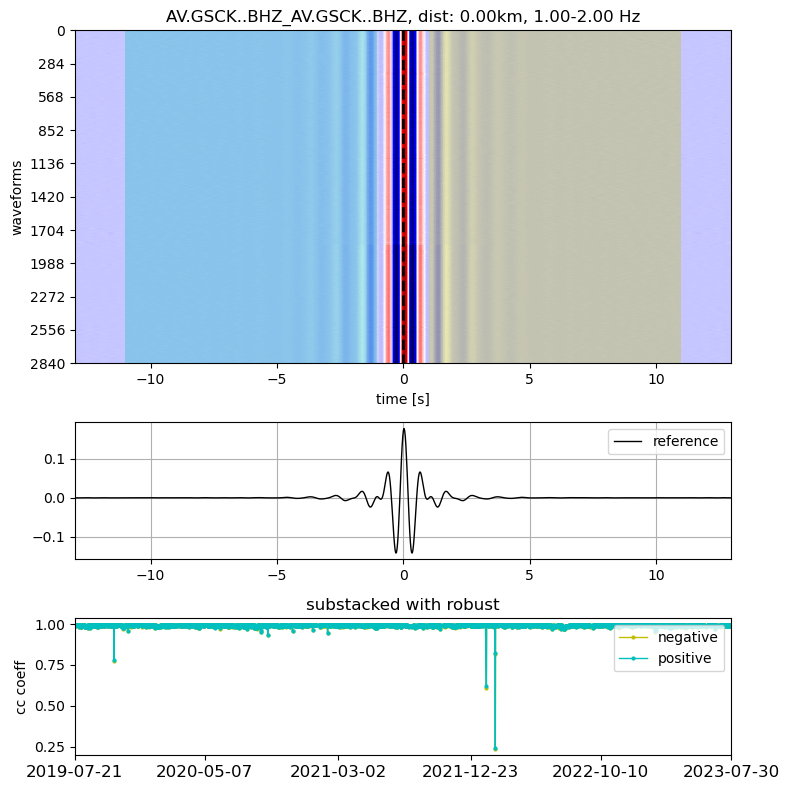

with 20 processors, took 15.252834 seconds
5563
5563


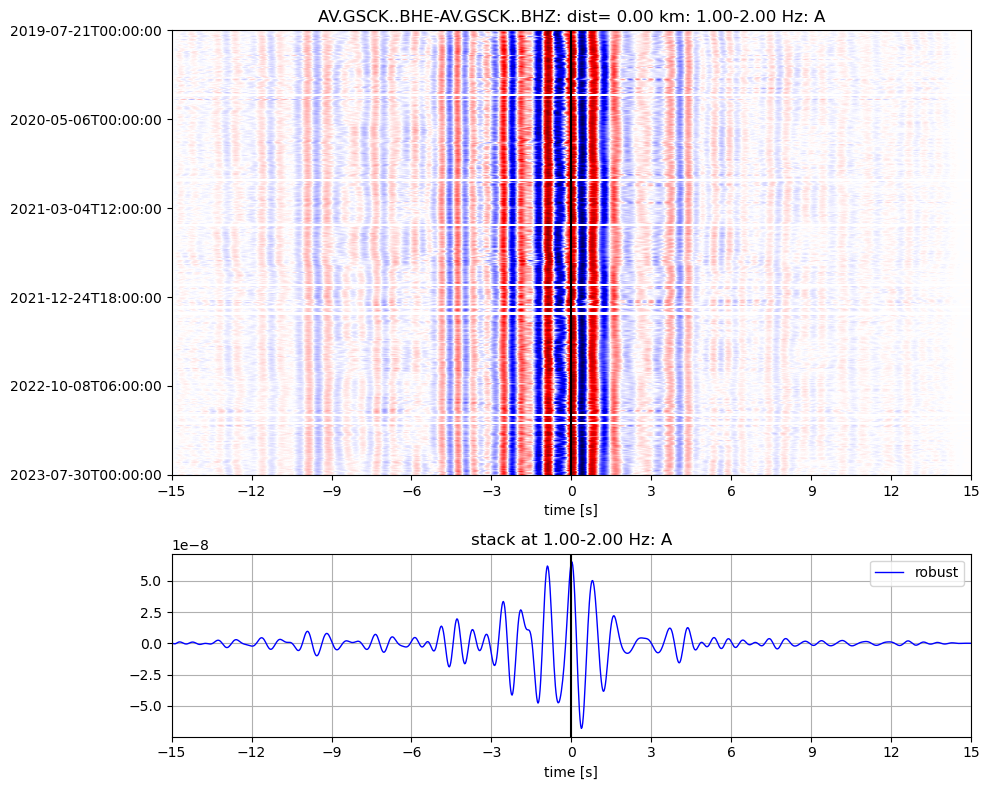

saving as: dvv.AV.GSCK.AV.GSCK.EZ.redo.1-2Hz.ts.pk
working on 2784 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.EZ.redo.1-2Hz.ts.pk


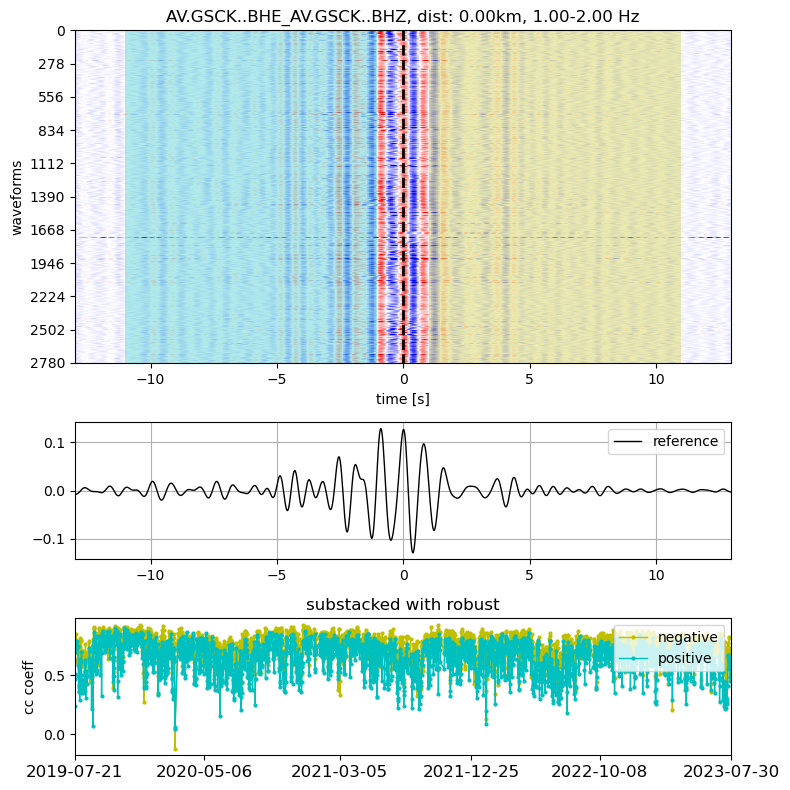

with 20 processors, took 15.811329 seconds
5563
5563


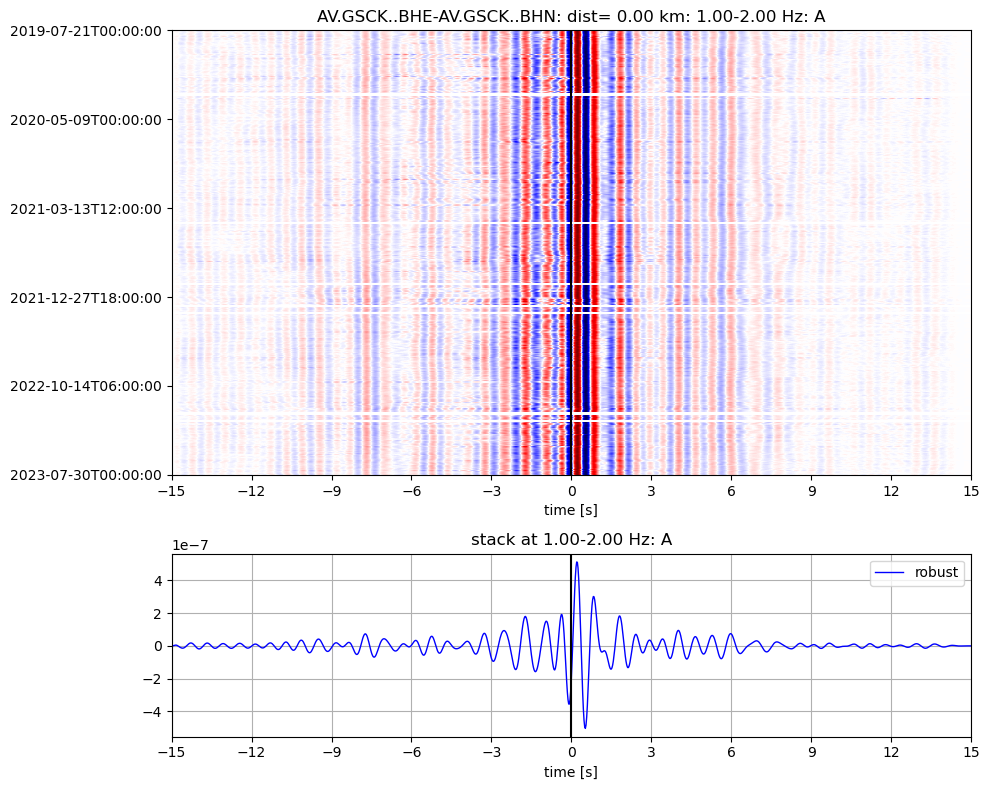

saving as: dvv.AV.GSCK.AV.GSCK.EN.redo.1-2Hz.ts.pk
working on 2784 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.EN.redo.1-2Hz.ts.pk


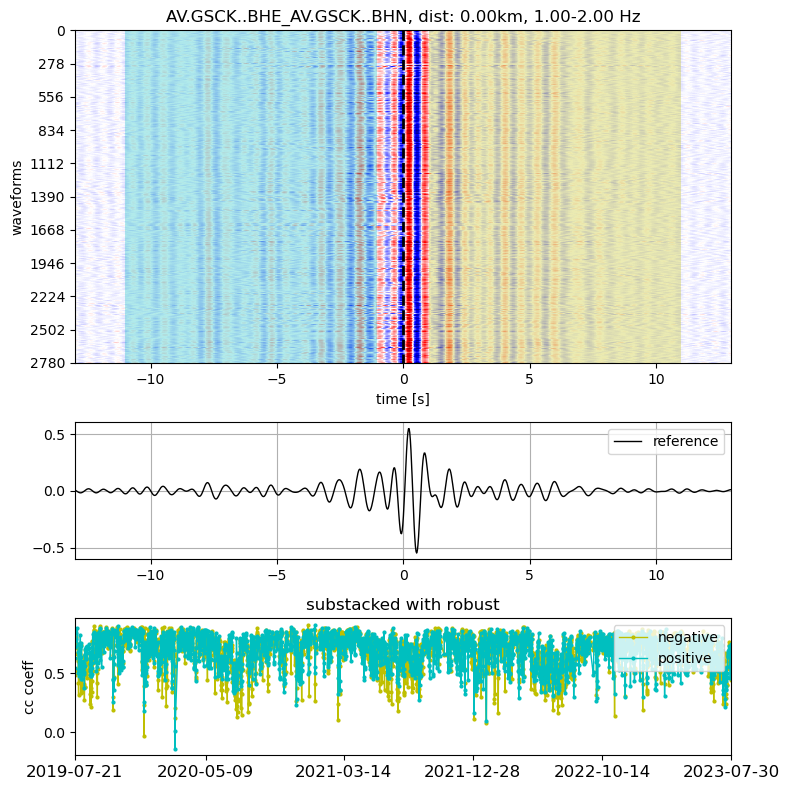

with 20 processors, took 15.749017 seconds
5523
5523


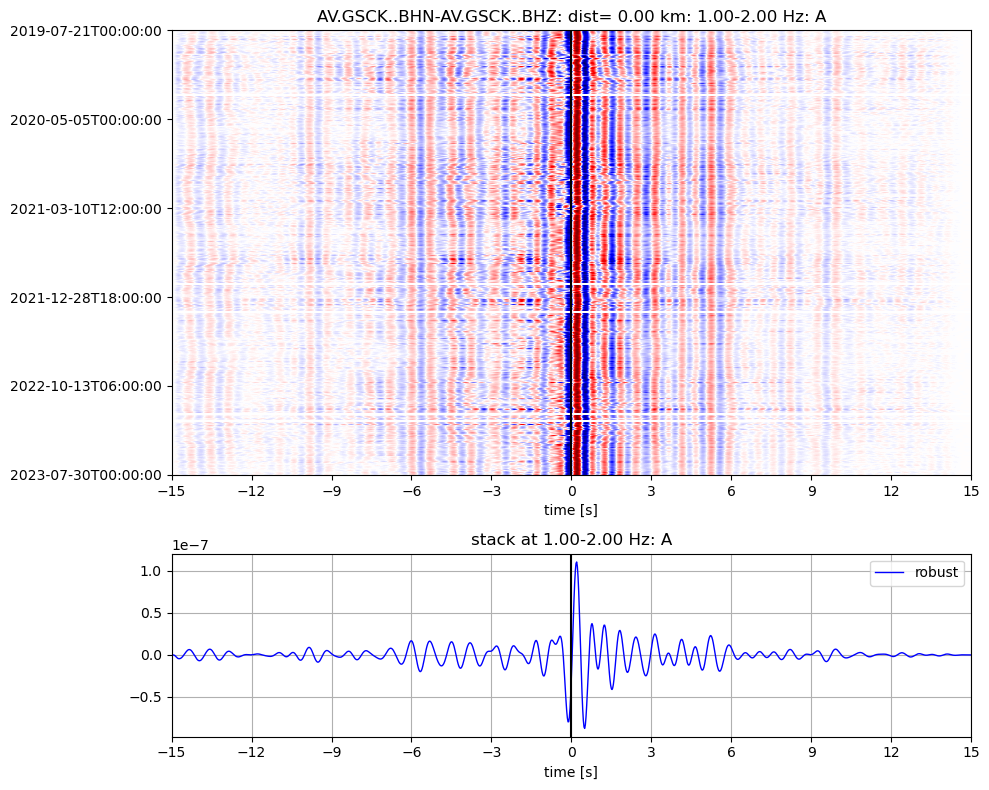

saving as: dvv.AV.GSCK.AV.GSCK.NZ.redo.1-2Hz.ts.pk
working on 2764 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSCK.AV.GSCK.NZ.redo.1-2Hz.ts.pk


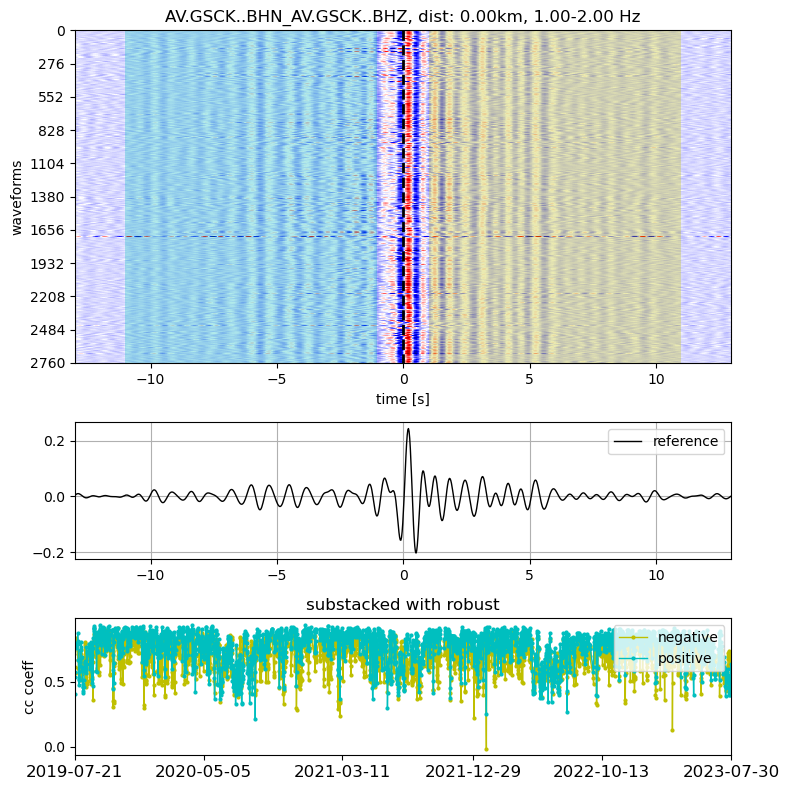

with 20 processors, took 14.422936 seconds
5841
5841


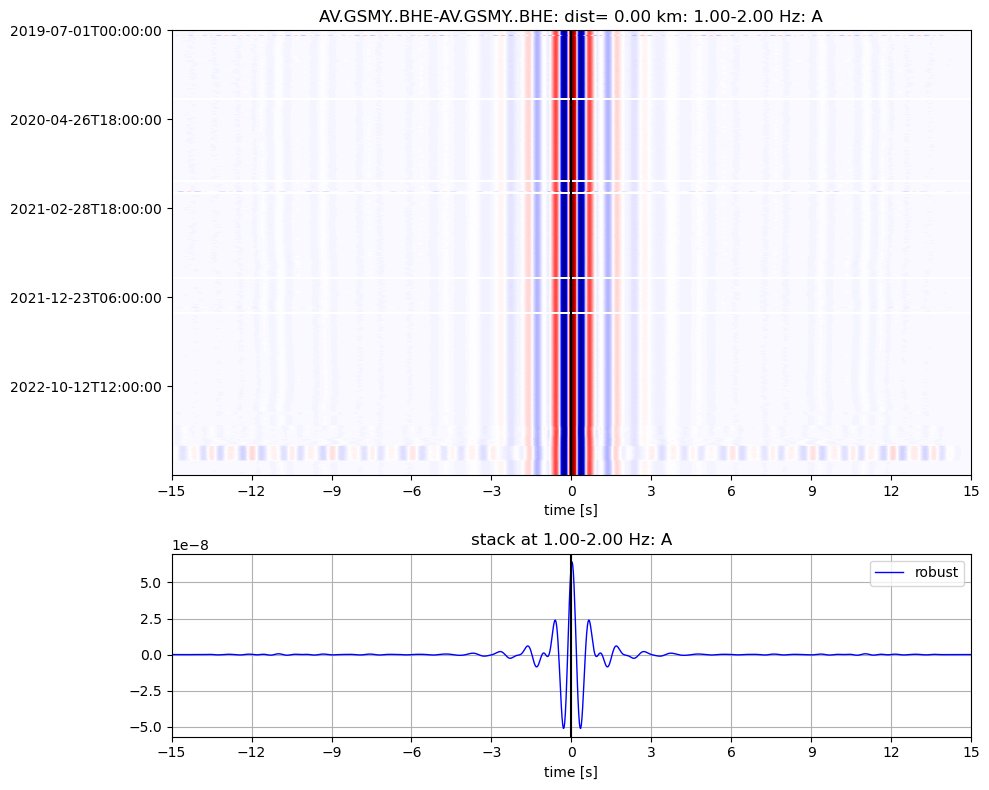

saving as: dvv.AV.GSMY.AV.GSMY.EE.redo.1-2Hz.ts.pk
working on 2915 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.EE.redo.1-2Hz.ts.pk


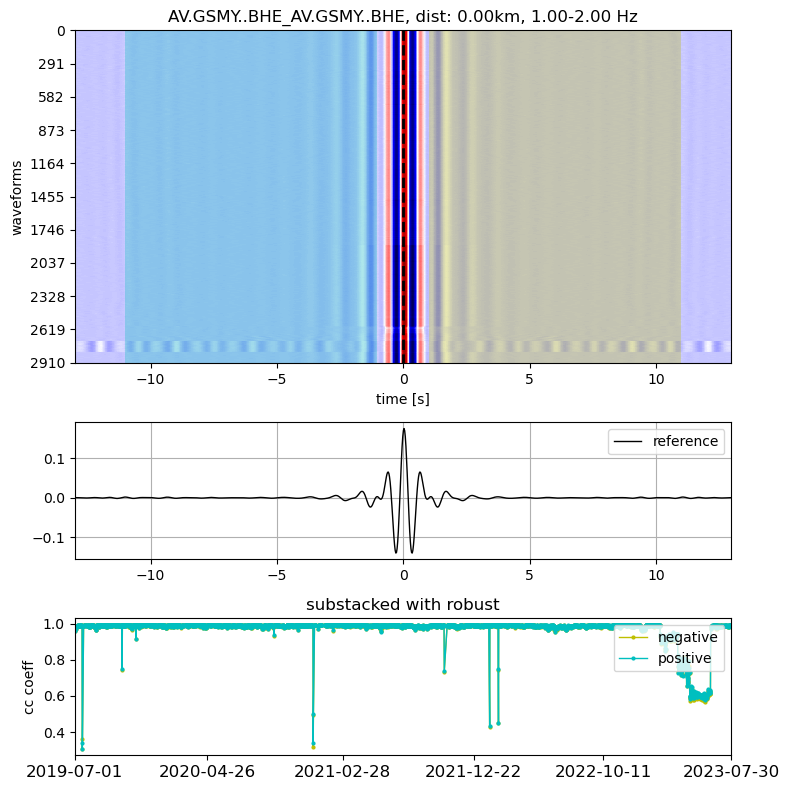

with 20 processors, took 14.512533 seconds
3764
3764


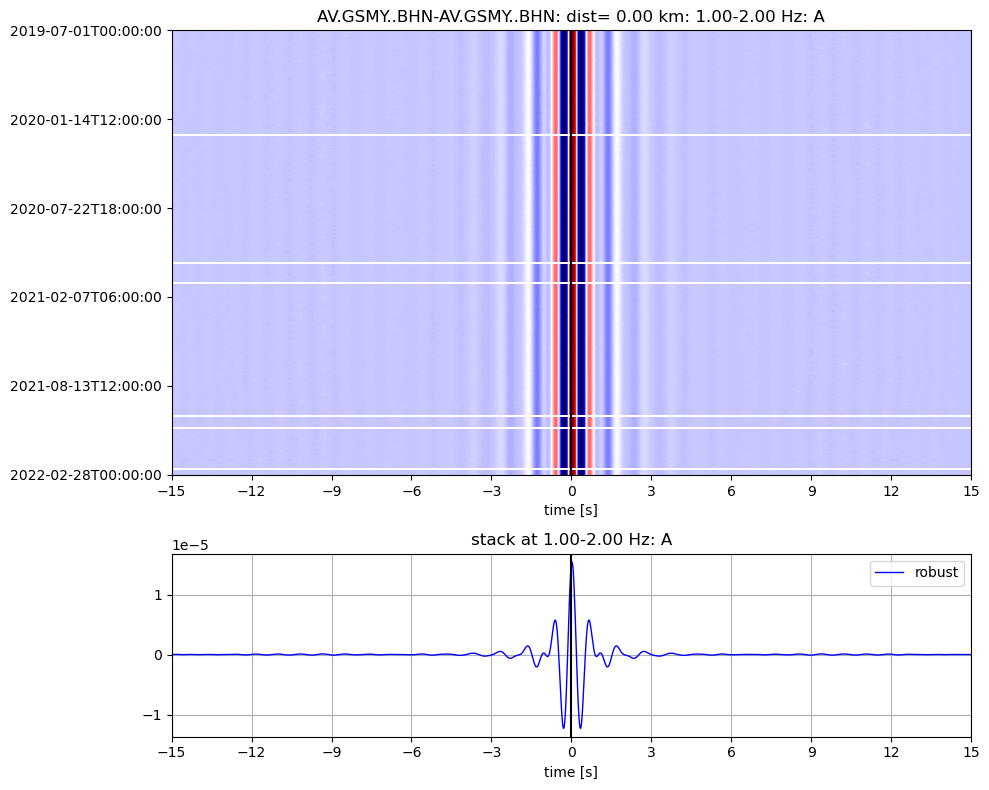

saving as: dvv.AV.GSMY.AV.GSMY.NN.redo.1-2Hz.ts.pk
working on 1876 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.NN.redo.1-2Hz.ts.pk


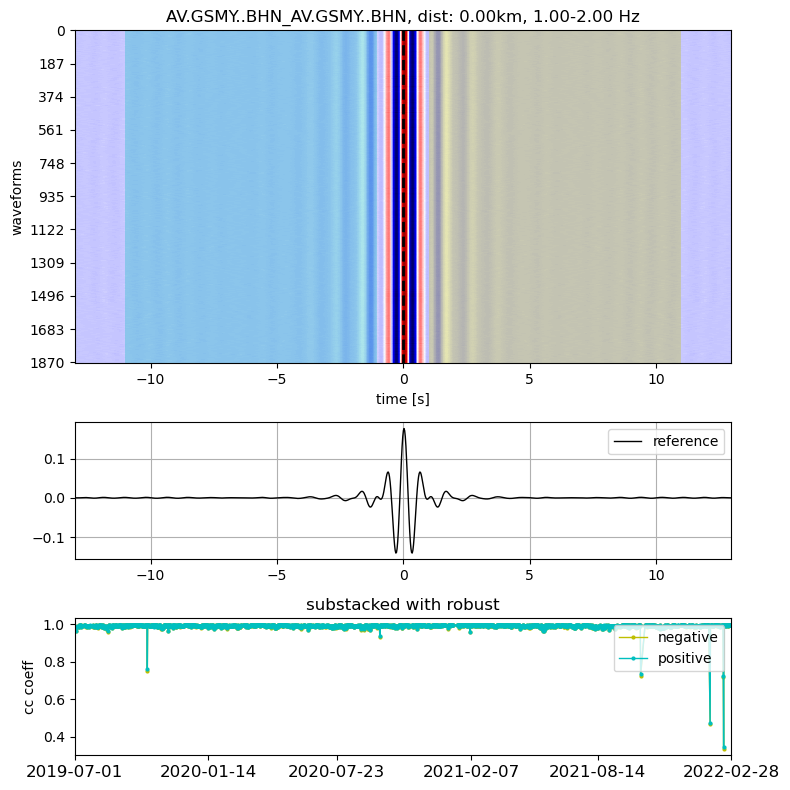

with 20 processors, took 10.347245 seconds
5784
5784


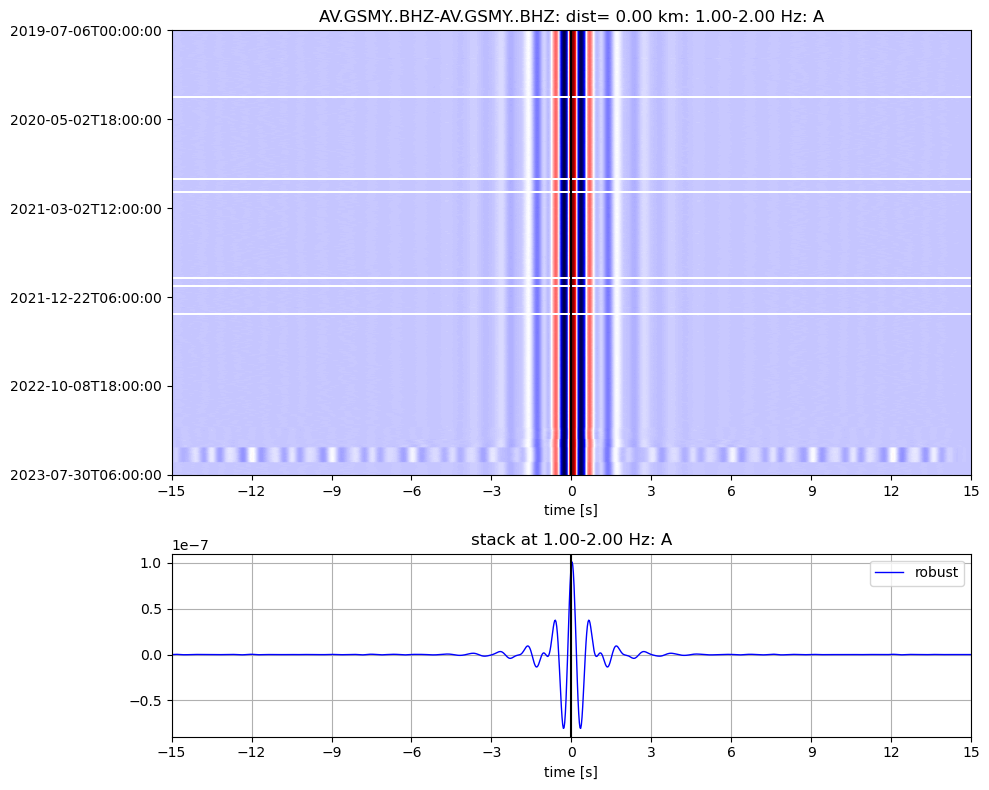

saving as: dvv.AV.GSMY.AV.GSMY.ZZ.redo.1-2Hz.ts.pk
working on 2888 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.ZZ.redo.1-2Hz.ts.pk


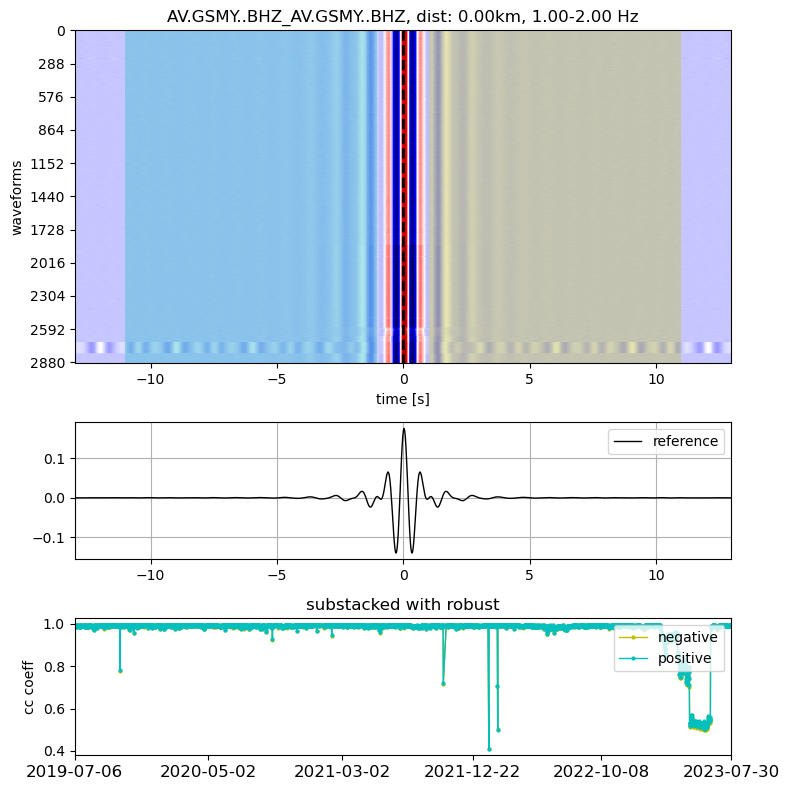

with 20 processors, took 14.256021 seconds
5690
5690


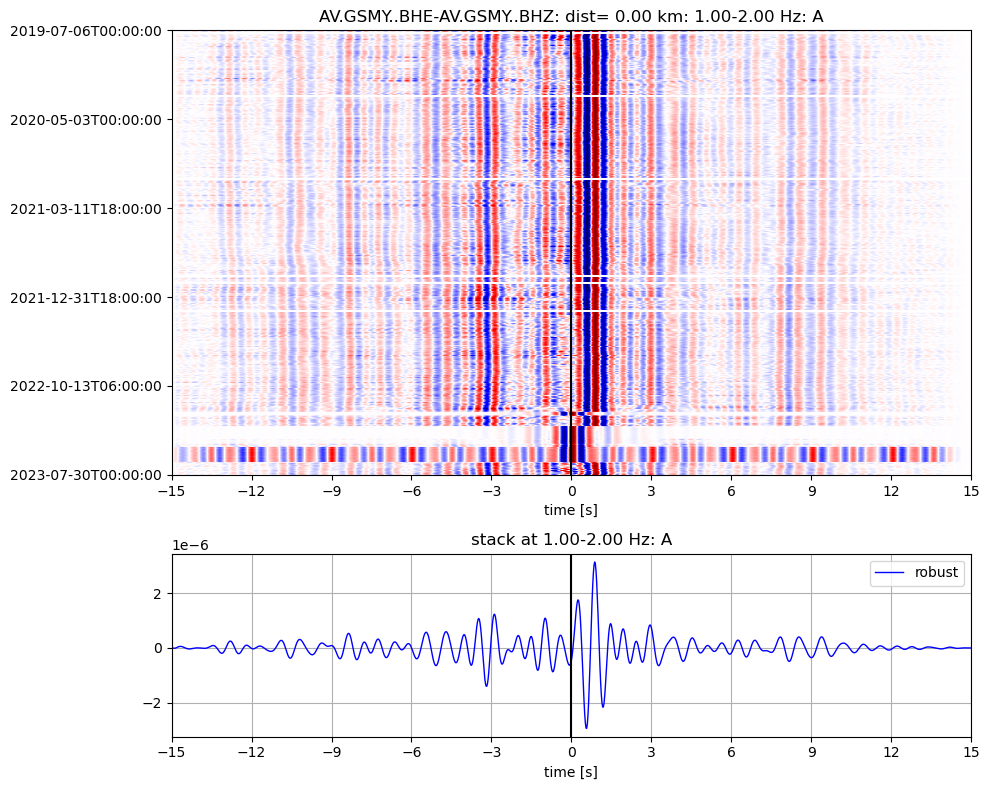

saving as: dvv.AV.GSMY.AV.GSMY.EZ.redo.1-2Hz.ts.pk
working on 2841 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.EZ.redo.1-2Hz.ts.pk


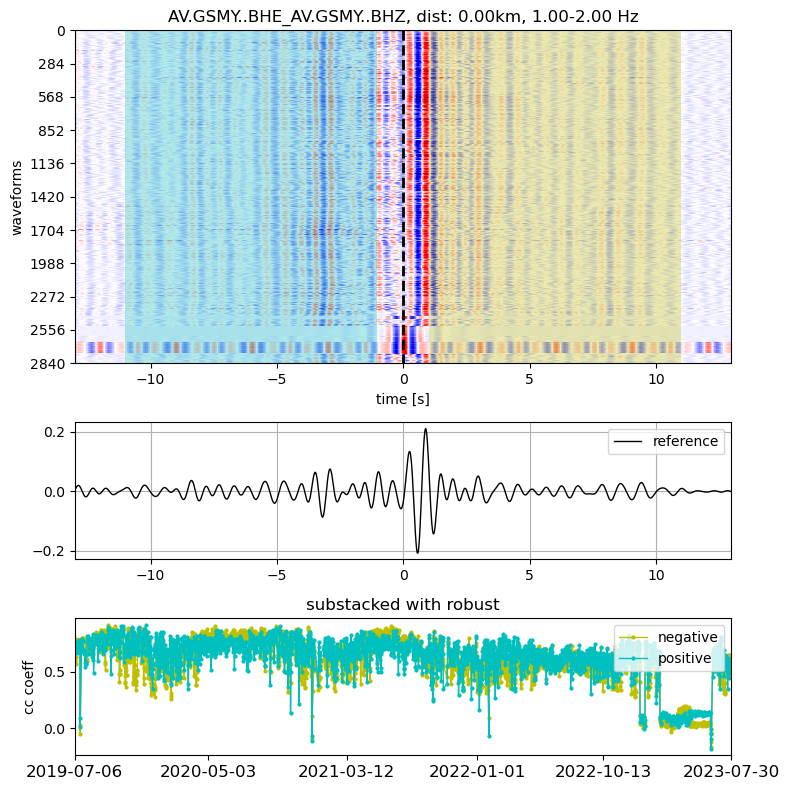

with 20 processors, took 15.355798 seconds
3670
3670


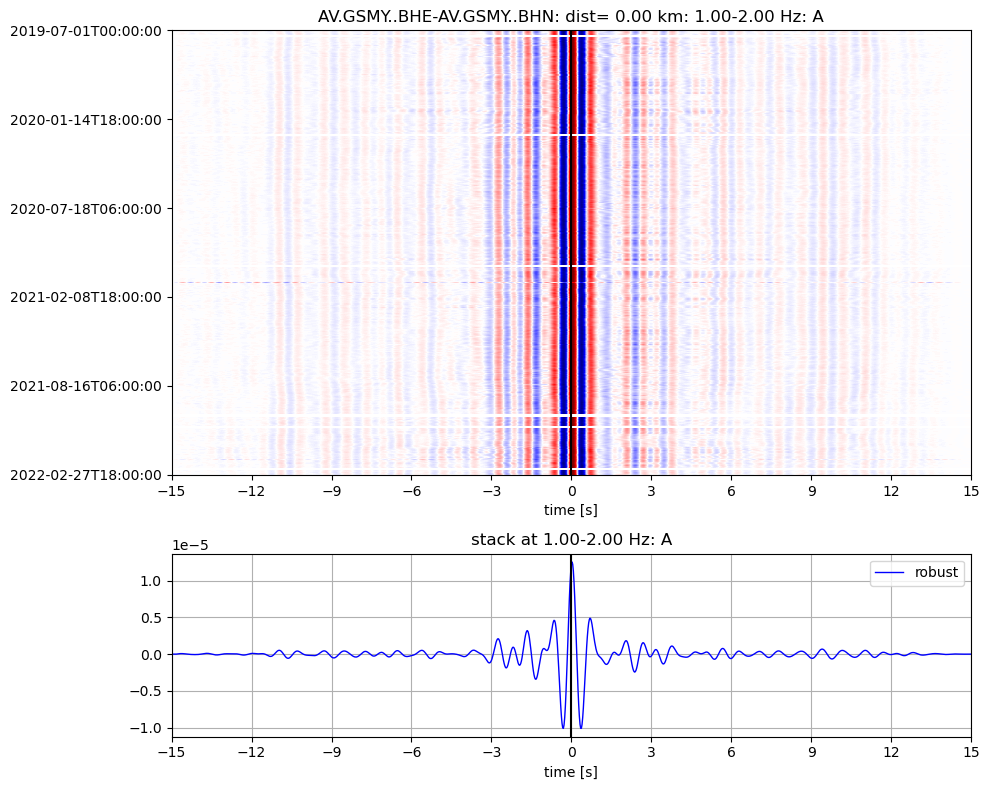

saving as: dvv.AV.GSMY.AV.GSMY.EN.redo.1-2Hz.ts.pk
working on 1829 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.EN.redo.1-2Hz.ts.pk


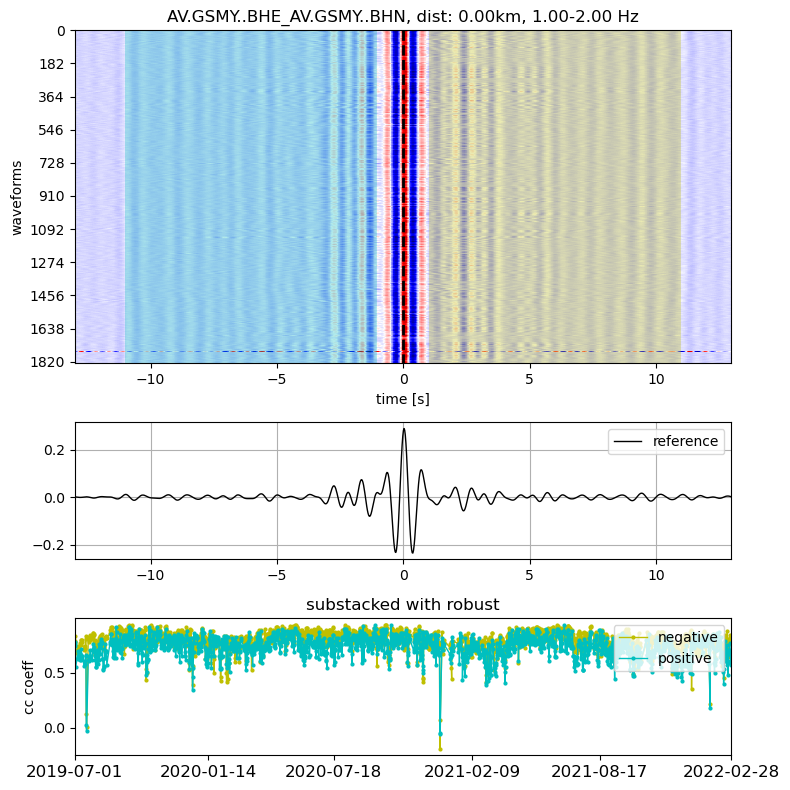

with 20 processors, took 10.584189 seconds
3661
3661


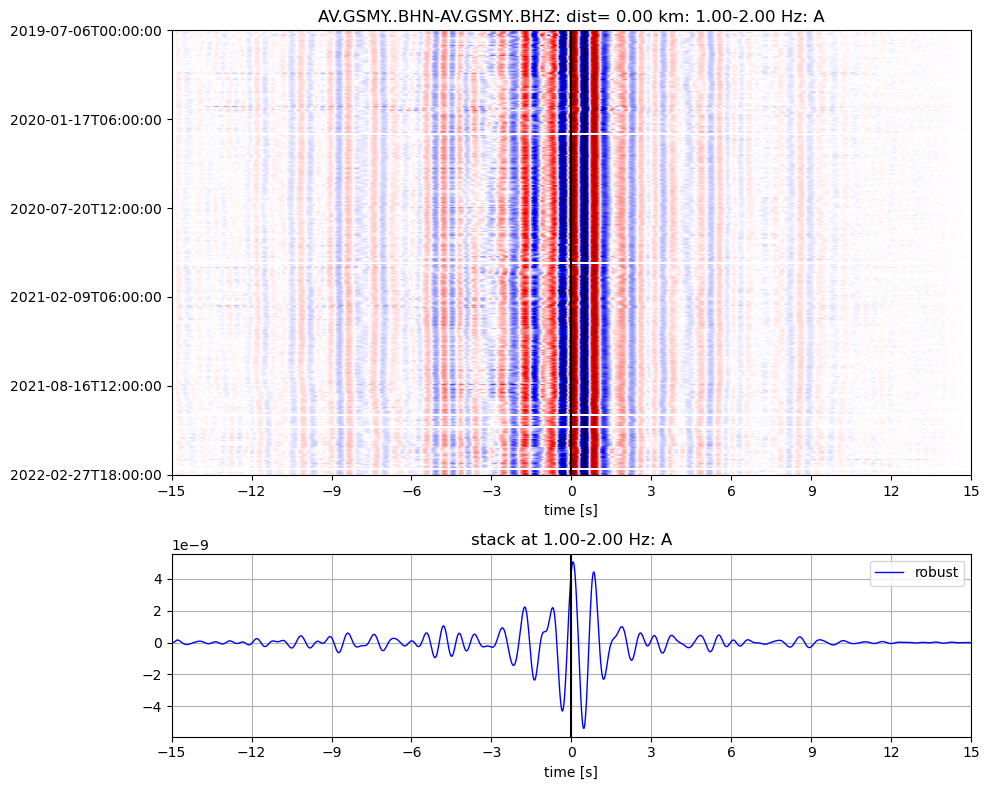

saving as: dvv.AV.GSMY.AV.GSMY.NZ.redo.1-2Hz.ts.pk
working on 1826 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSMY.AV.GSMY.NZ.redo.1-2Hz.ts.pk


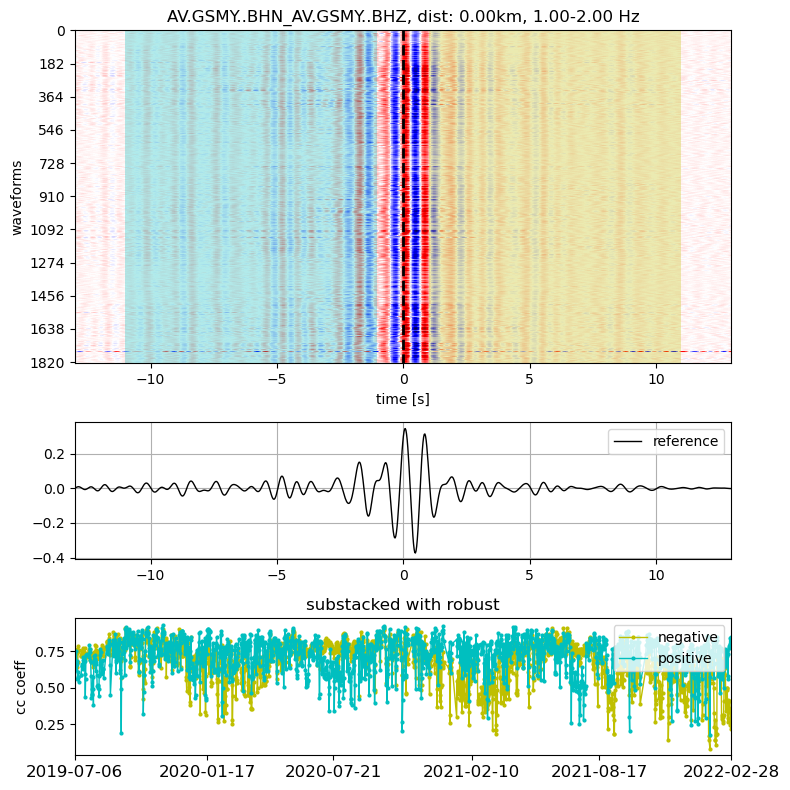

with 20 processors, took 9.898618 seconds
5947
5947


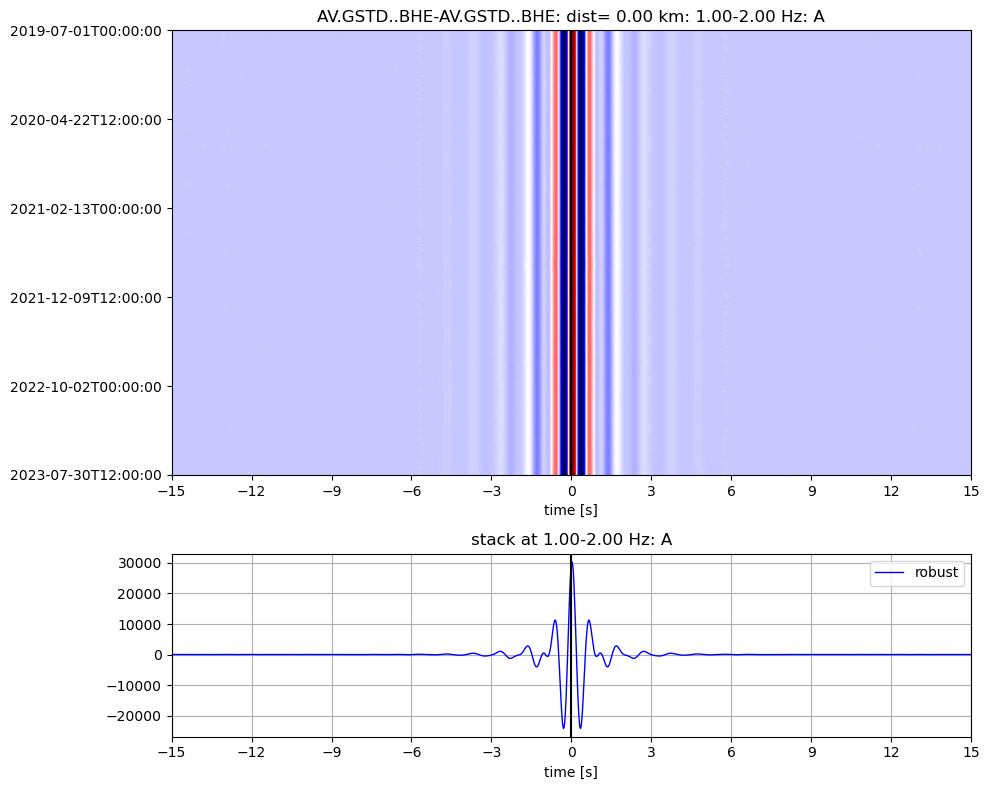

saving as: dvv.AV.GSTD.AV.GSTD.EE.redo.1-2Hz.ts.pk
working on 2965 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.EE.redo.1-2Hz.ts.pk


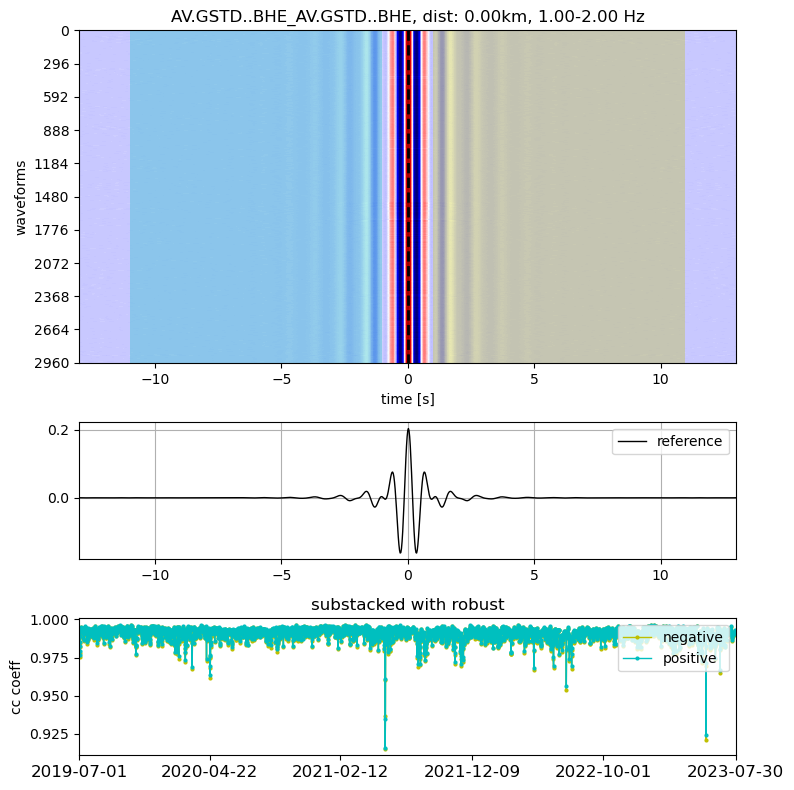

with 20 processors, took 14.953430 seconds
5959
5959


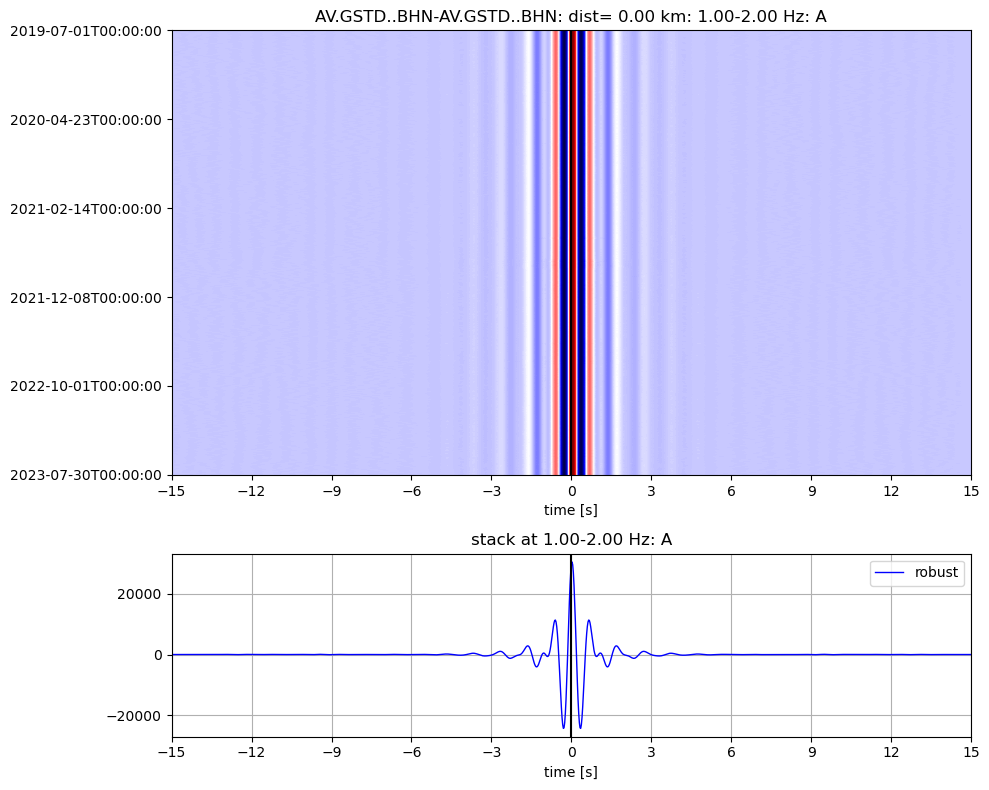

saving as: dvv.AV.GSTD.AV.GSTD.NN.redo.1-2Hz.ts.pk
working on 2971 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.NN.redo.1-2Hz.ts.pk


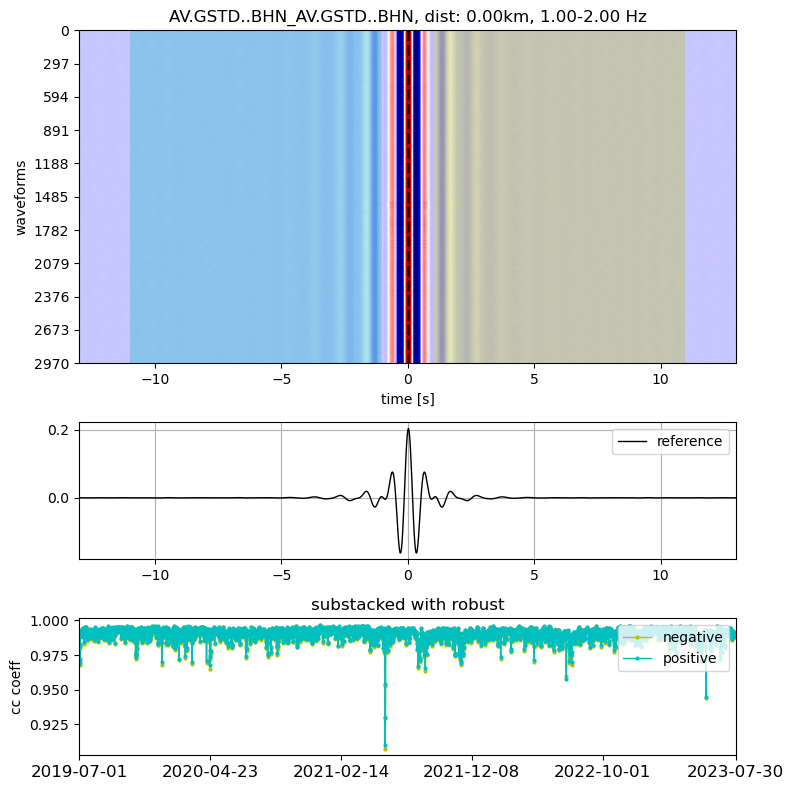

with 20 processors, took 16.109352 seconds
5935
5935


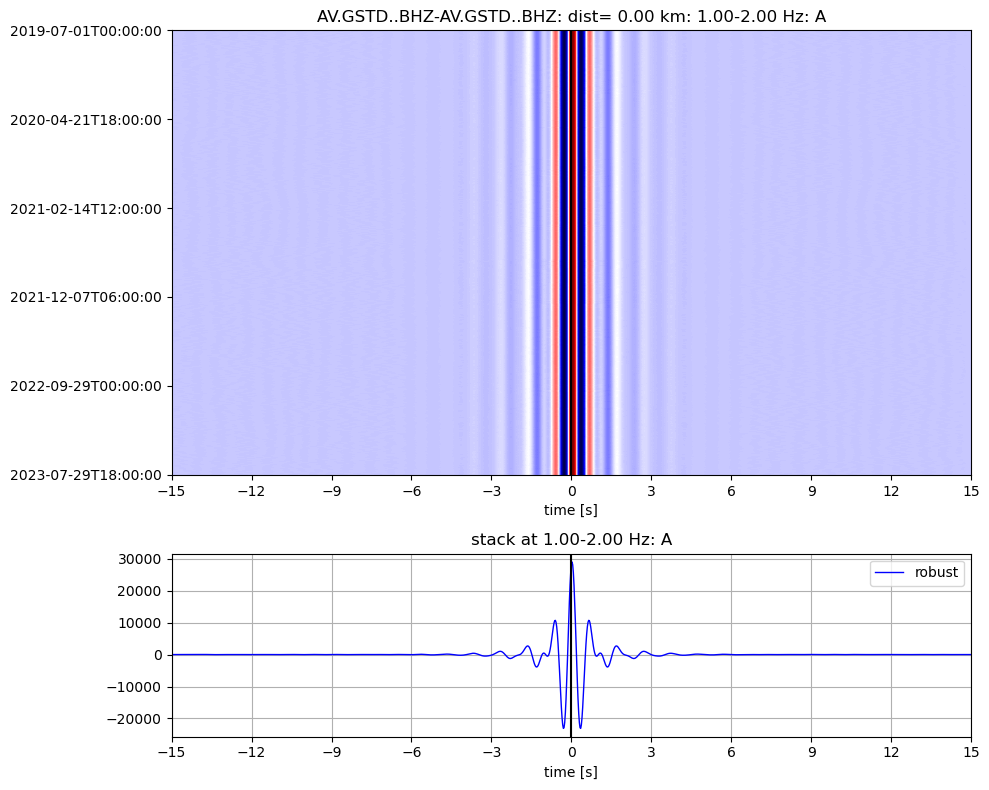

saving as: dvv.AV.GSTD.AV.GSTD.ZZ.redo.1-2Hz.ts.pk
working on 2959 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.ZZ.redo.1-2Hz.ts.pk


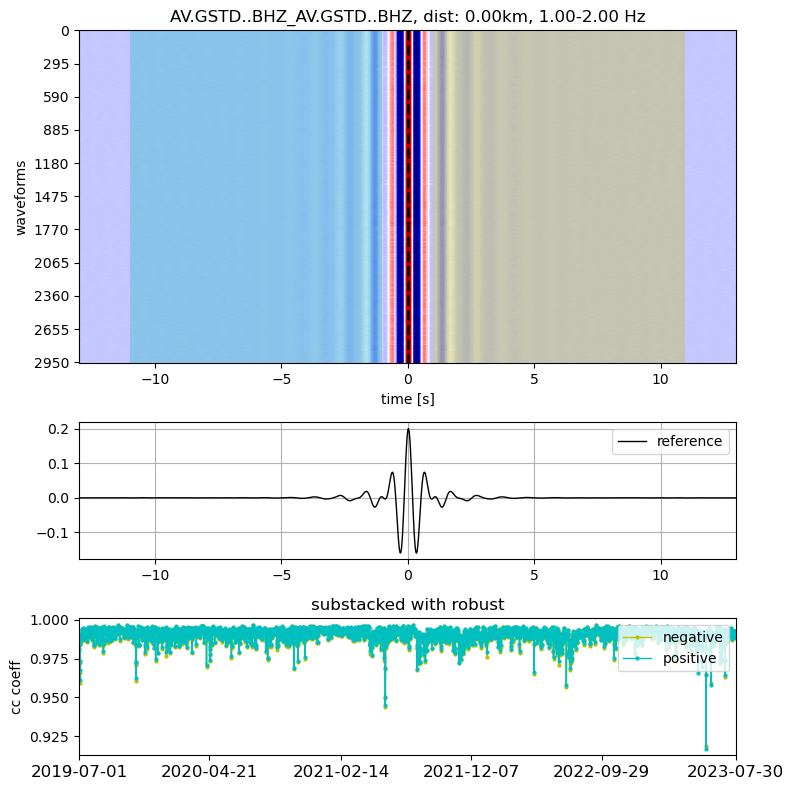

with 20 processors, took 16.626283 seconds
5903
5903


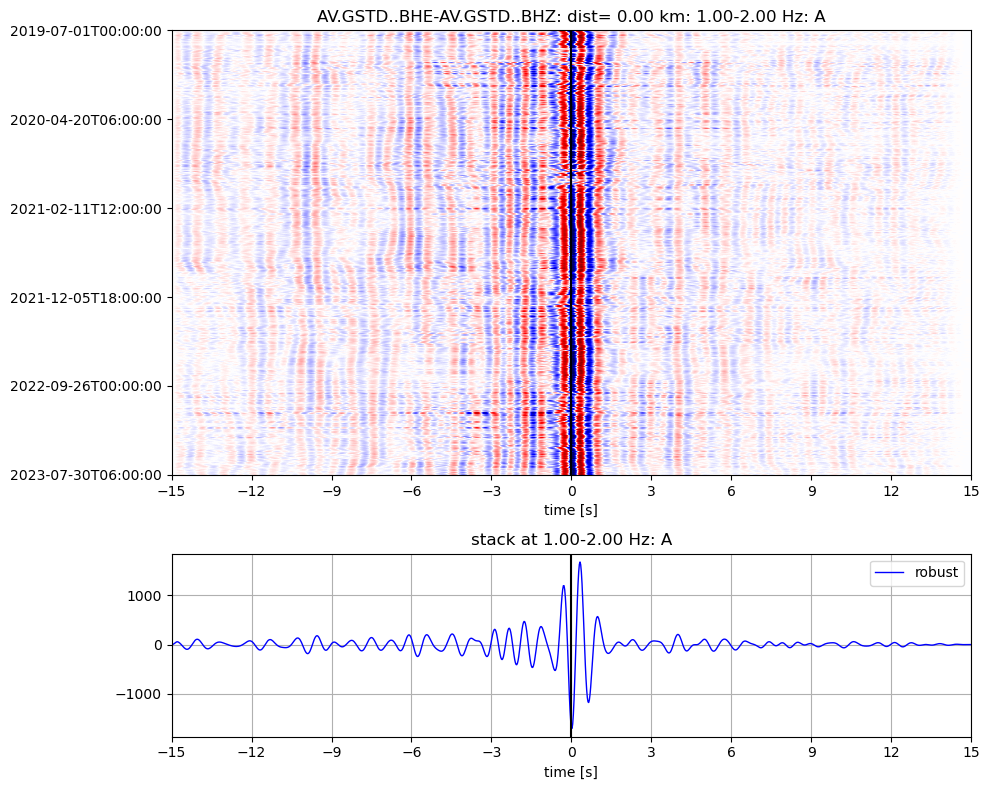

saving as: dvv.AV.GSTD.AV.GSTD.EZ.redo.1-2Hz.ts.pk
working on 2943 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.EZ.redo.1-2Hz.ts.pk


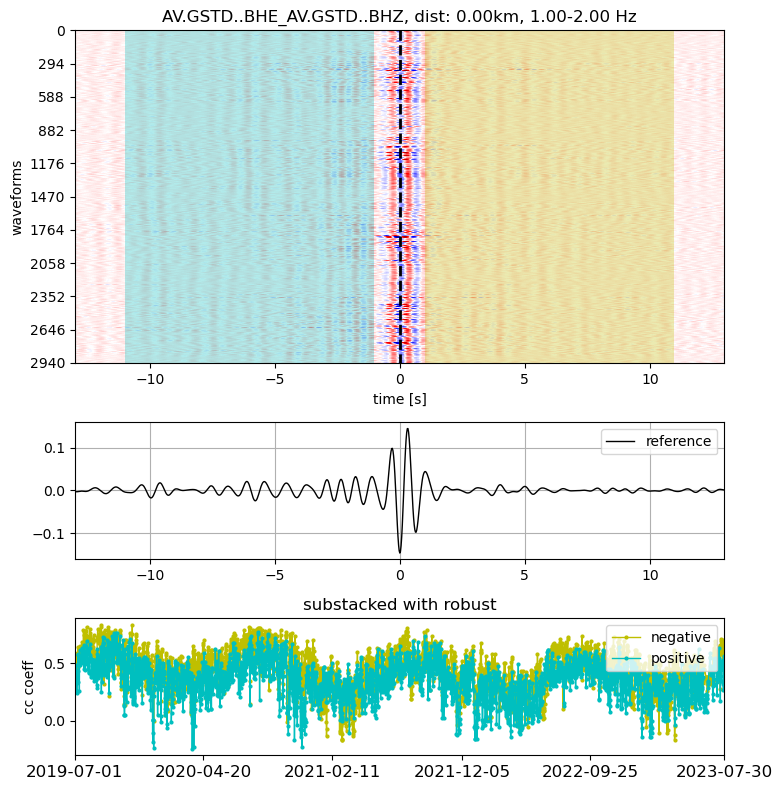

with 20 processors, took 16.566706 seconds
5915
5915


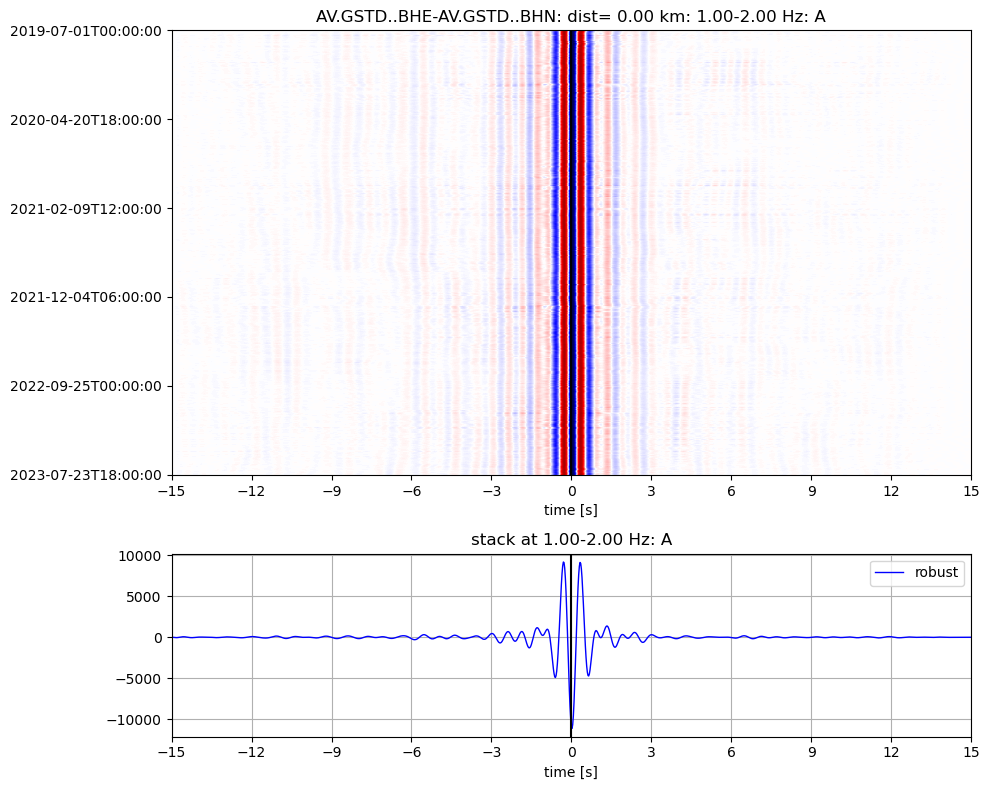

saving as: dvv.AV.GSTD.AV.GSTD.EN.redo.1-2Hz.ts.pk
working on 2949 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.EN.redo.1-2Hz.ts.pk


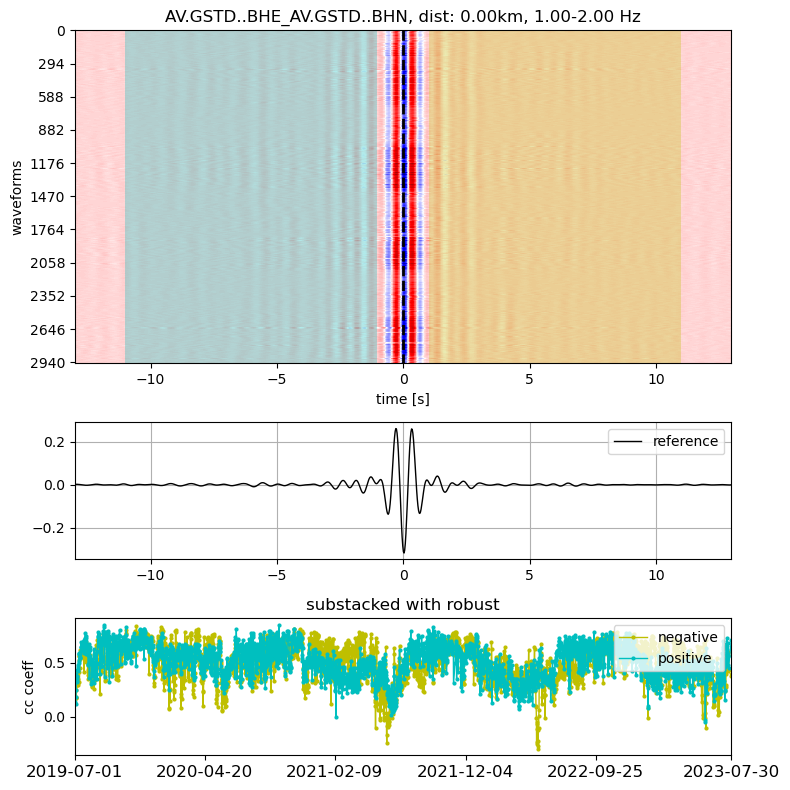

with 20 processors, took 16.491277 seconds
5903
5903


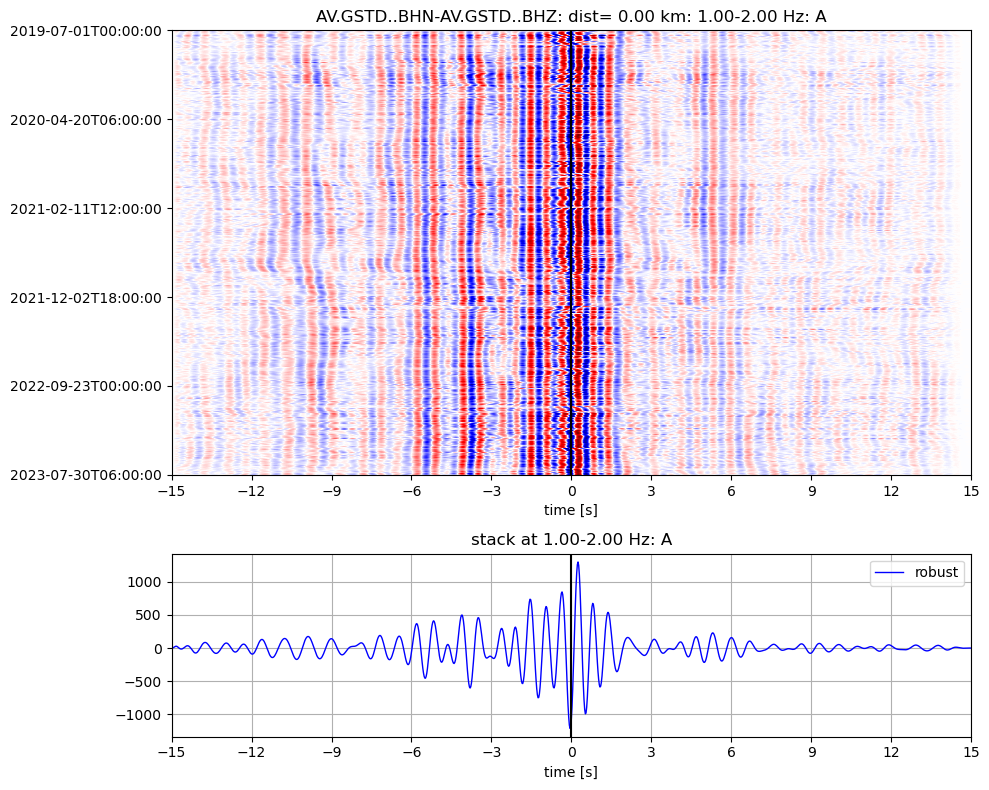

saving as: dvv.AV.GSTD.AV.GSTD.NZ.redo.1-2Hz.ts.pk
working on 2943 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTD.AV.GSTD.NZ.redo.1-2Hz.ts.pk


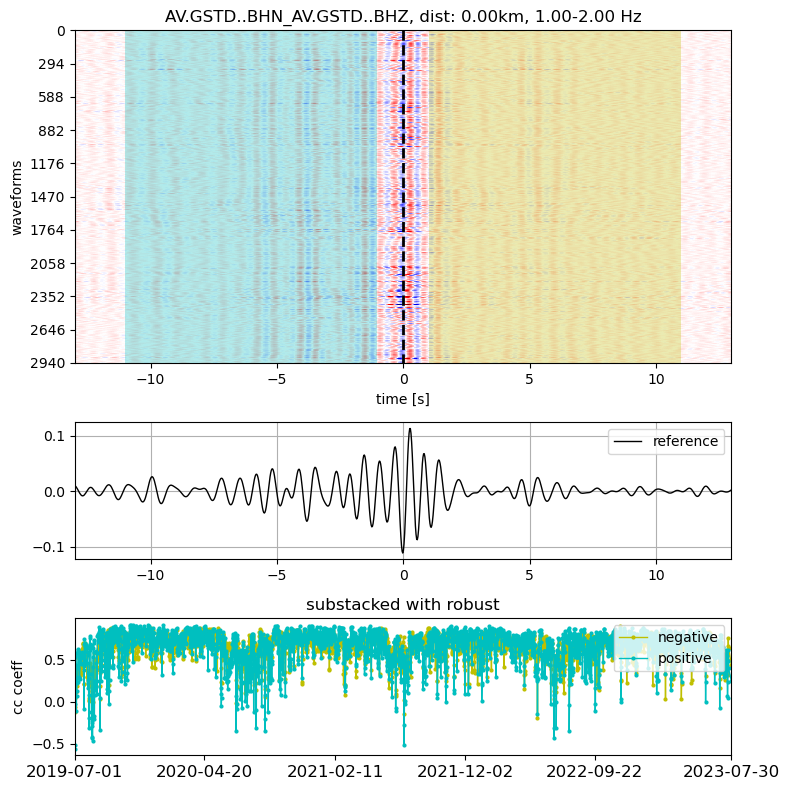

with 20 processors, took 16.778821 seconds
5609
5609


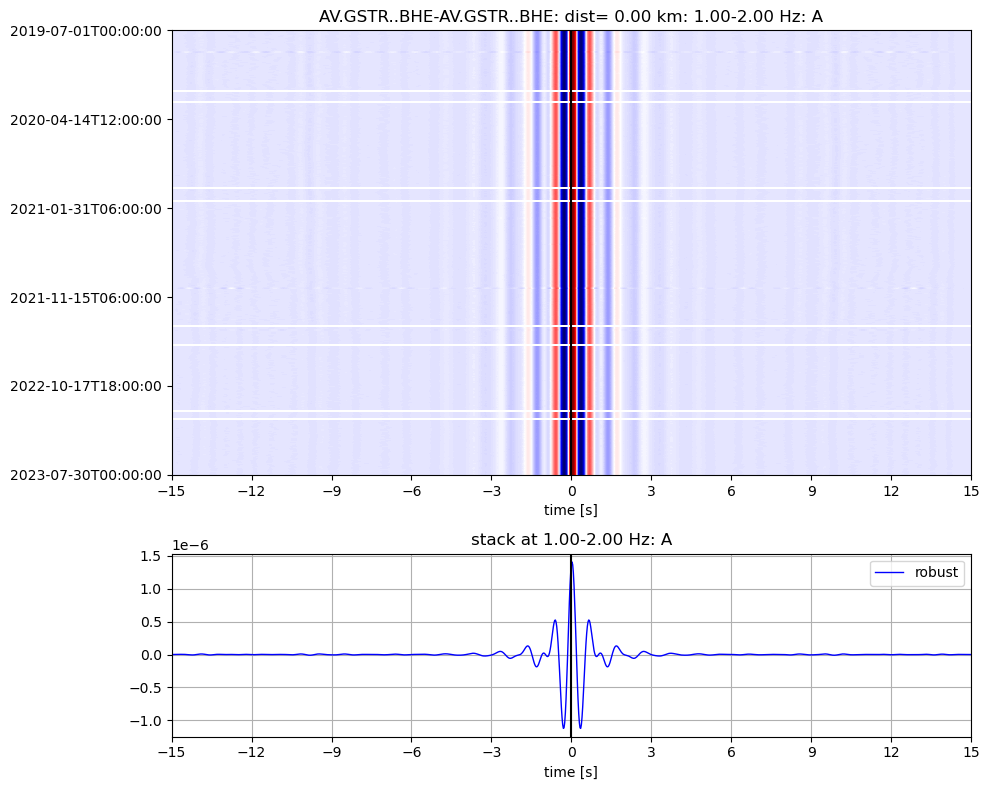

saving as: dvv.AV.GSTR.AV.GSTR.EE.redo.1-2Hz.ts.pk
working on 2802 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.EE.redo.1-2Hz.ts.pk


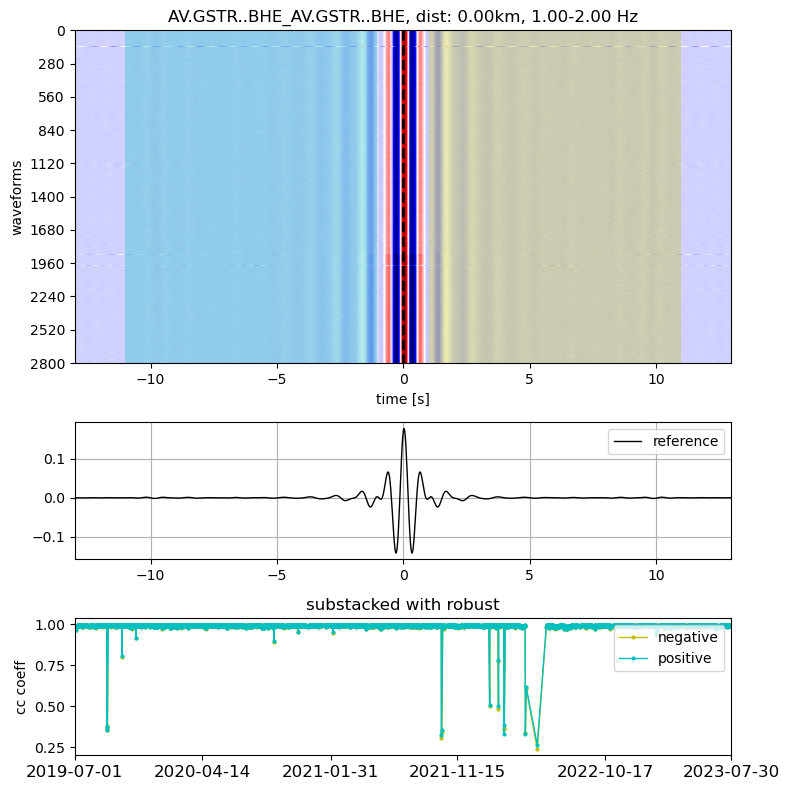

with 20 processors, took 13.606300 seconds
5640
5640


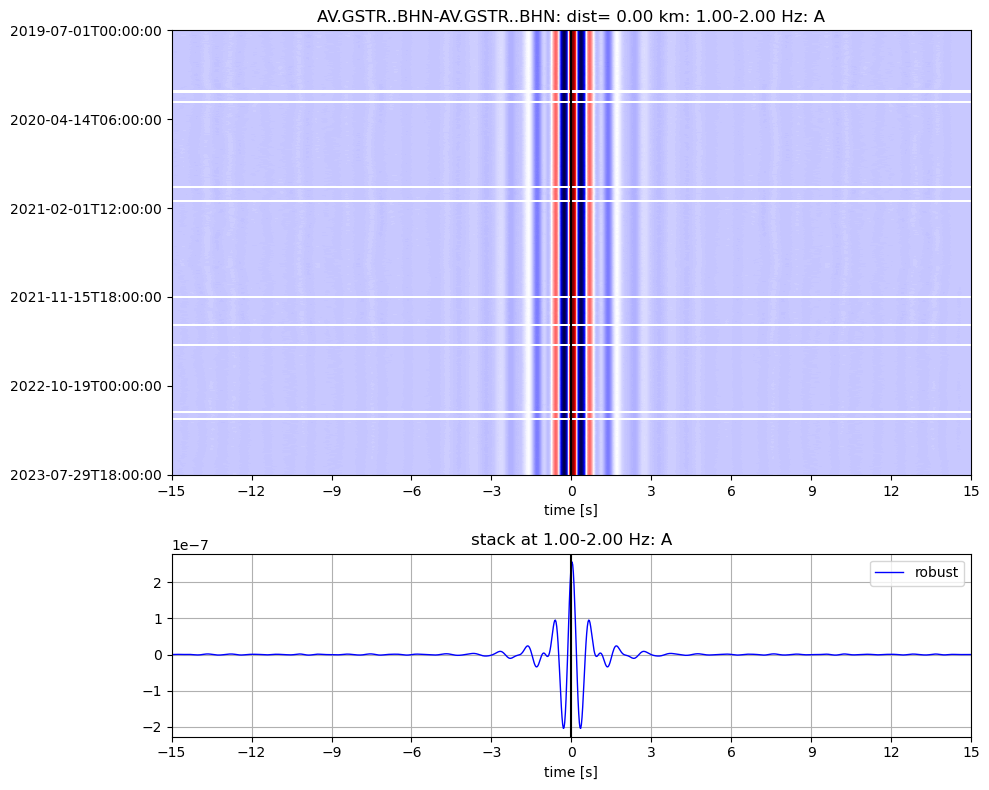

saving as: dvv.AV.GSTR.AV.GSTR.NN.redo.1-2Hz.ts.pk
working on 2816 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.NN.redo.1-2Hz.ts.pk


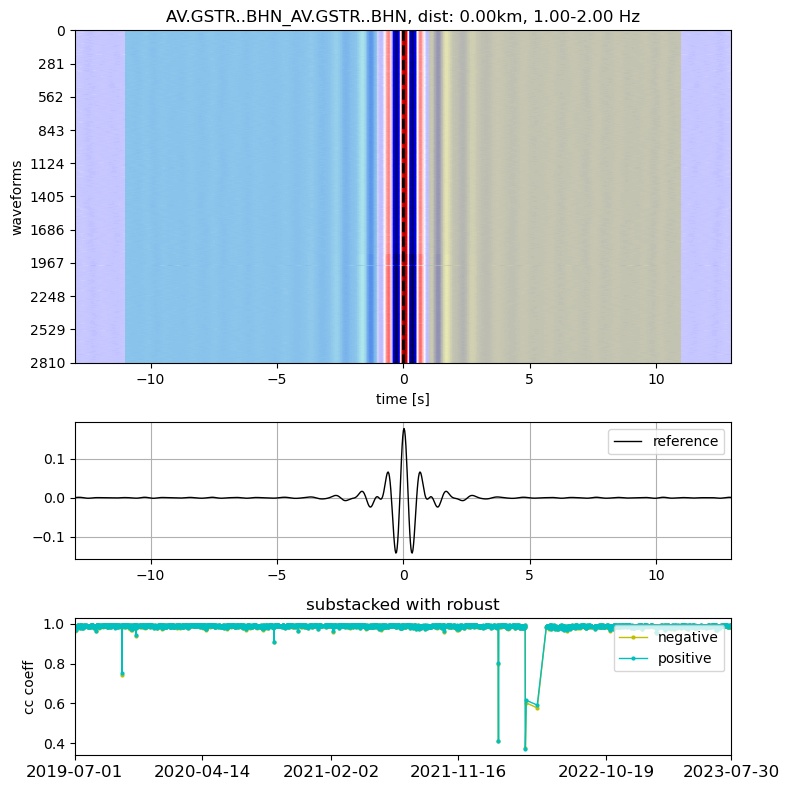

with 20 processors, took 14.888260 seconds
5588
5588


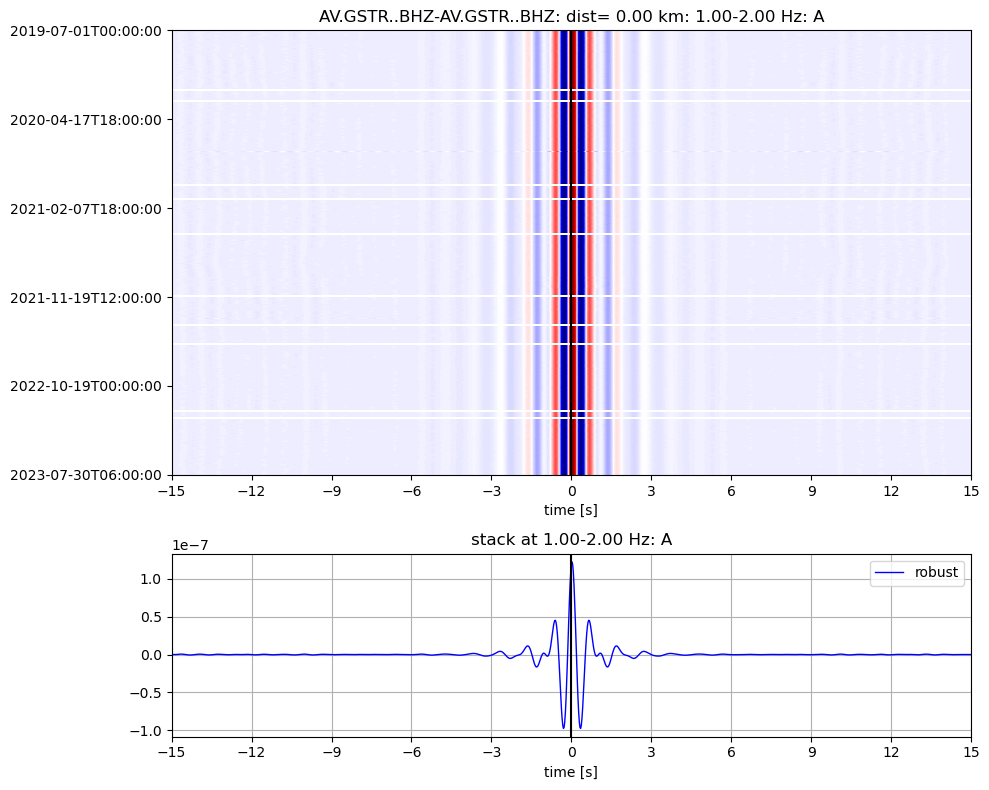

saving as: dvv.AV.GSTR.AV.GSTR.ZZ.redo.1-2Hz.ts.pk
working on 2791 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.ZZ.redo.1-2Hz.ts.pk


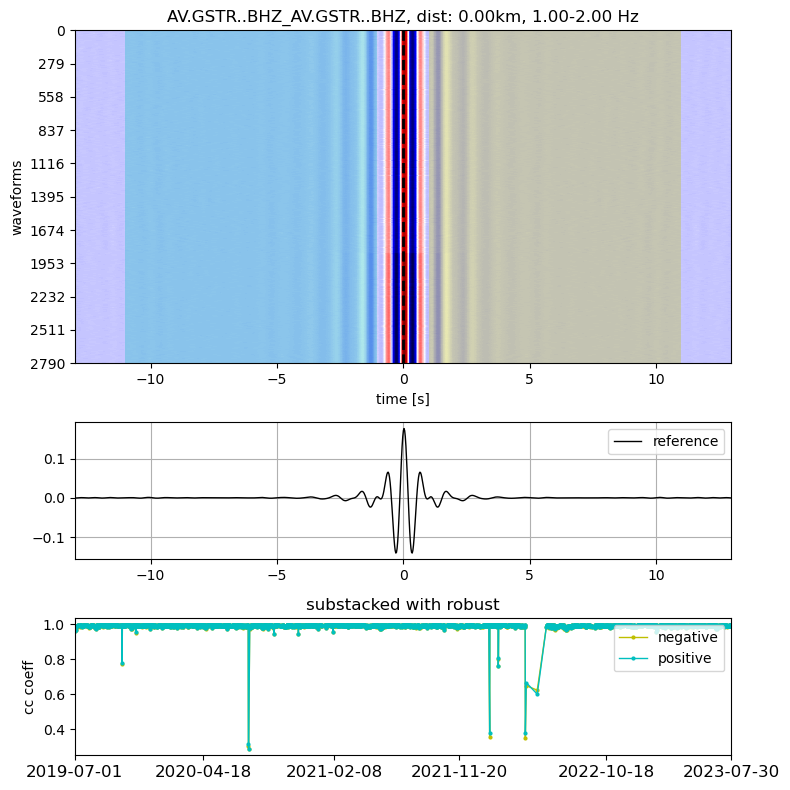

with 20 processors, took 15.486935 seconds
5460
5460


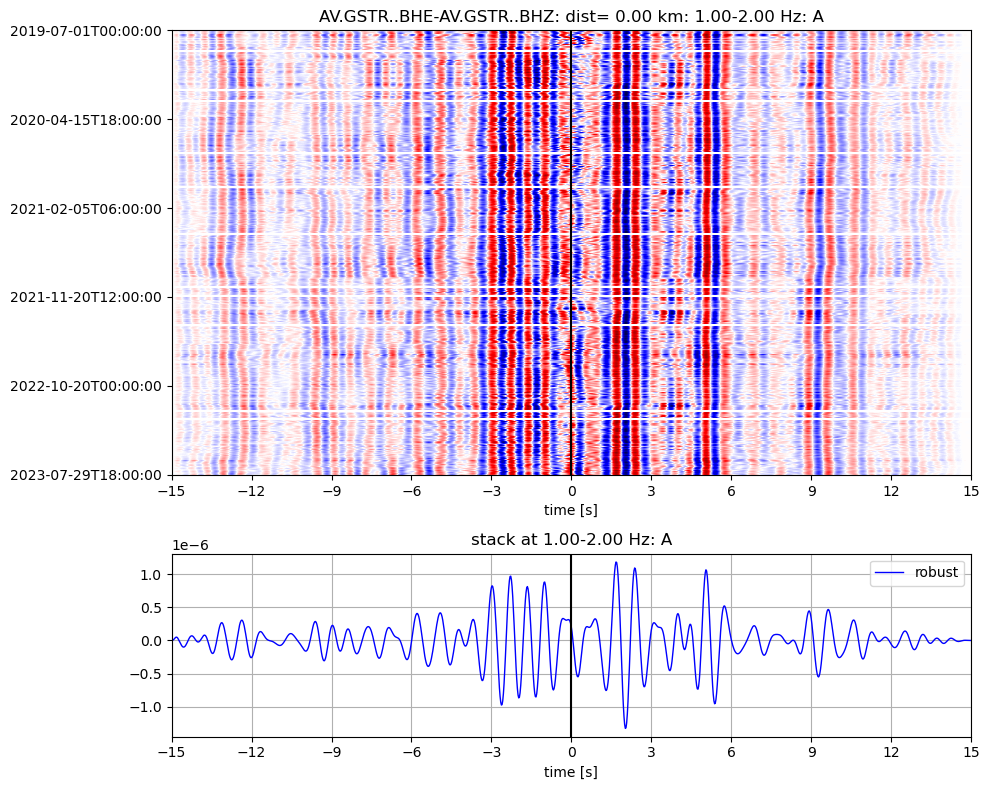

saving as: dvv.AV.GSTR.AV.GSTR.EZ.redo.1-2Hz.ts.pk
working on 2726 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.EZ.redo.1-2Hz.ts.pk


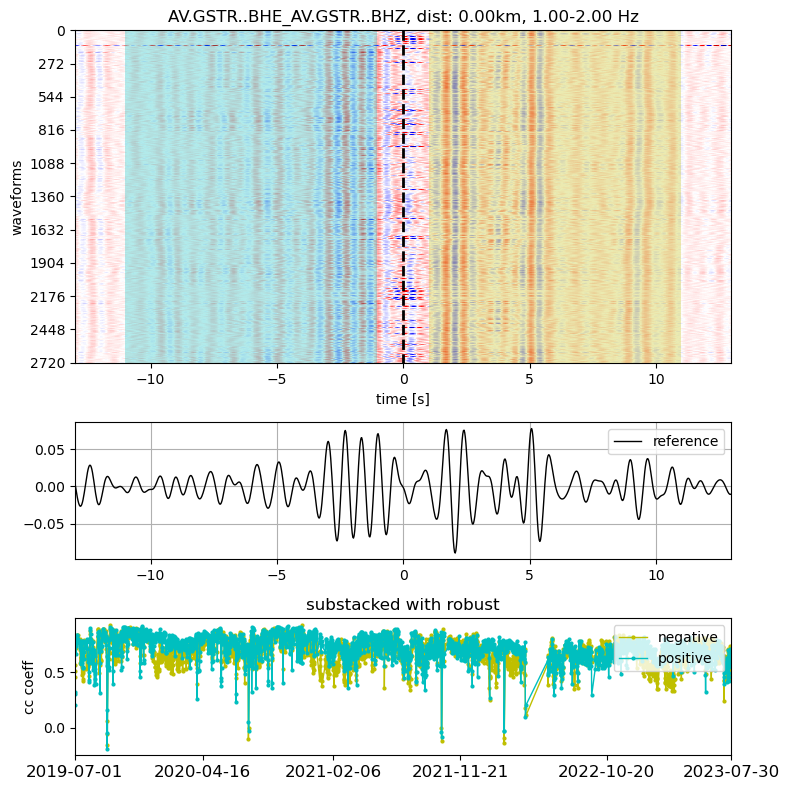

with 20 processors, took 15.619411 seconds
5498
5498


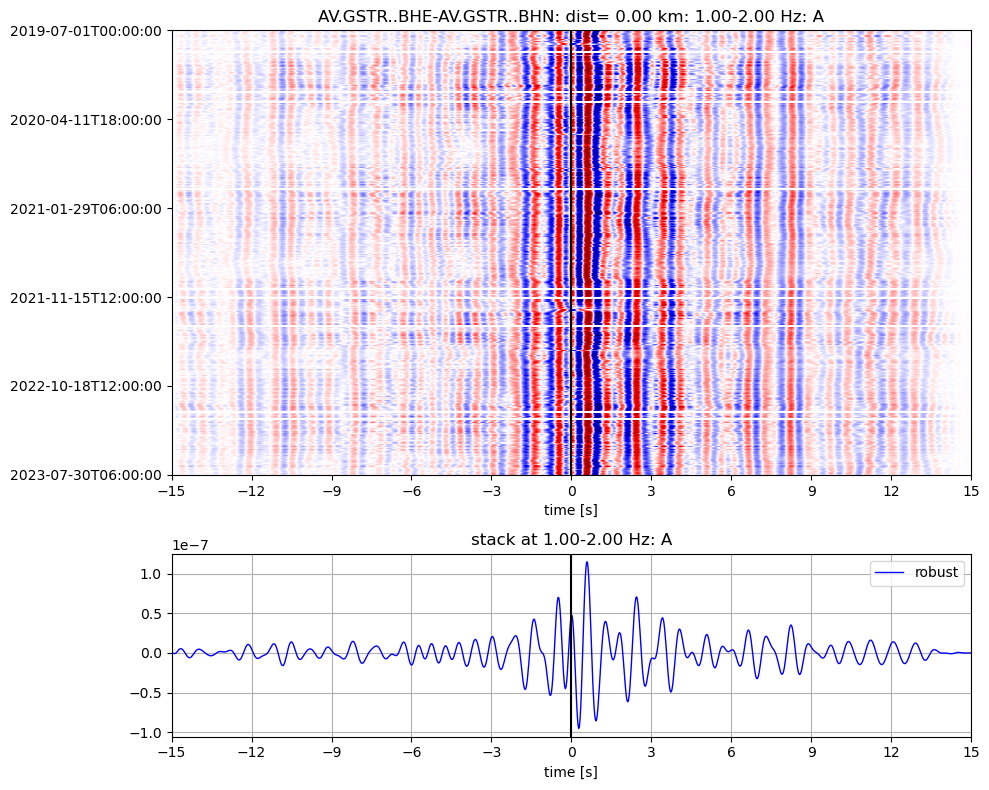

saving as: dvv.AV.GSTR.AV.GSTR.EN.redo.1-2Hz.ts.pk
working on 2744 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.EN.redo.1-2Hz.ts.pk


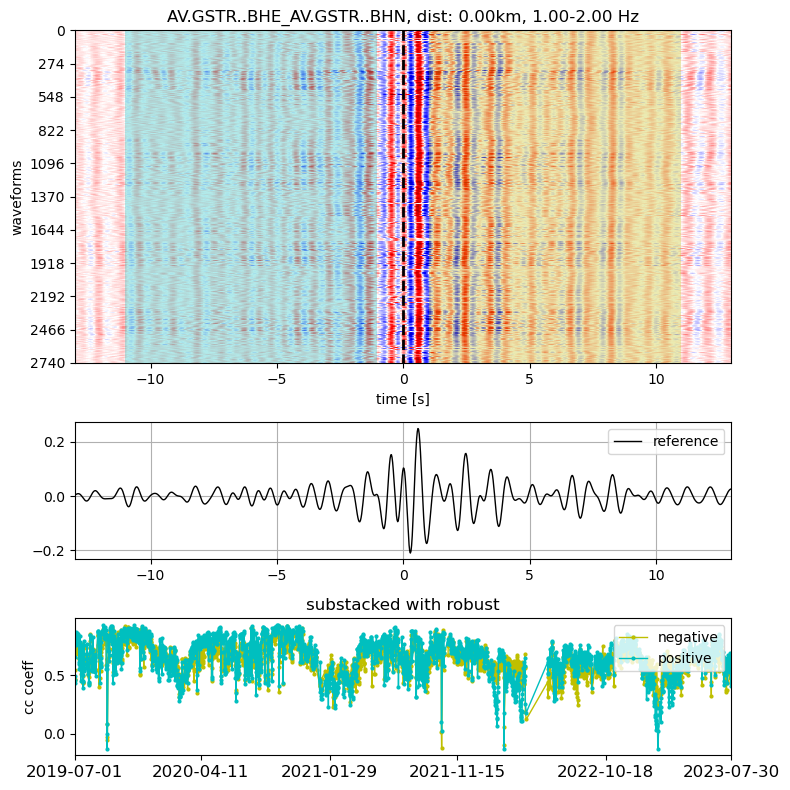

with 20 processors, took 14.683271 seconds
5477
5477


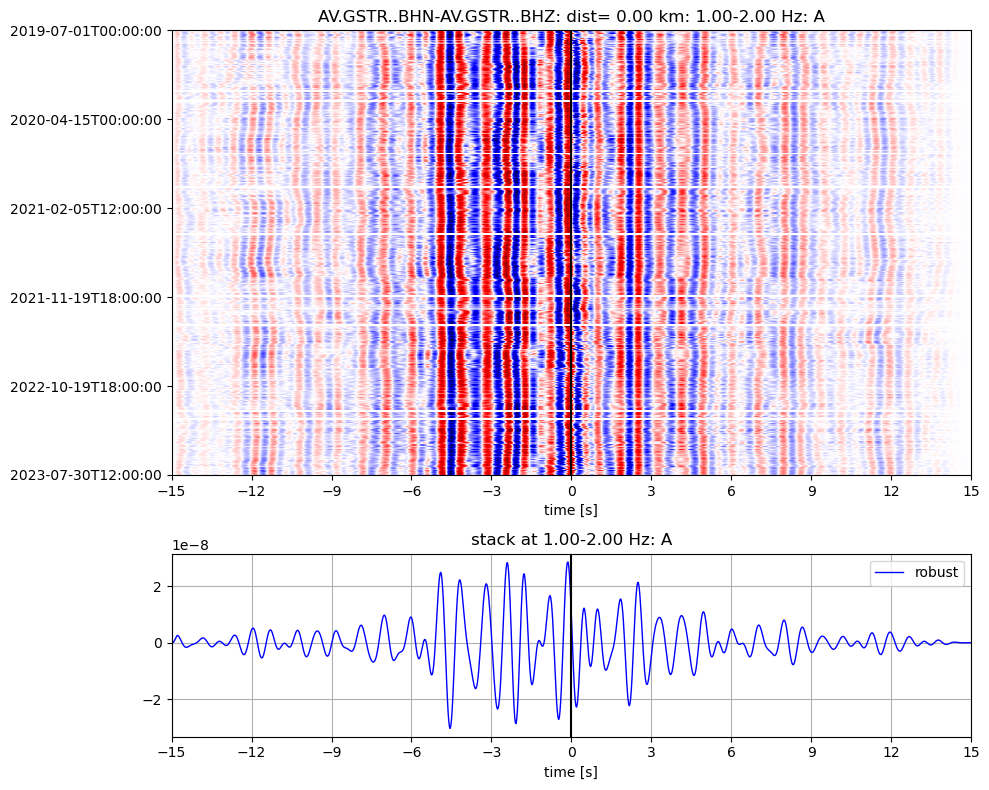

saving as: dvv.AV.GSTR.AV.GSTR.NZ.redo.1-2Hz.ts.pk
working on 2733 windows with 20 workers.
DvvData saved to: /depot/xtyang/data/projects/volcanodvv/data_greatsitkin/dvv_5sta_redo/dvv.AV.GSTR.AV.GSTR.NZ.redo.1-2Hz.ts.pk


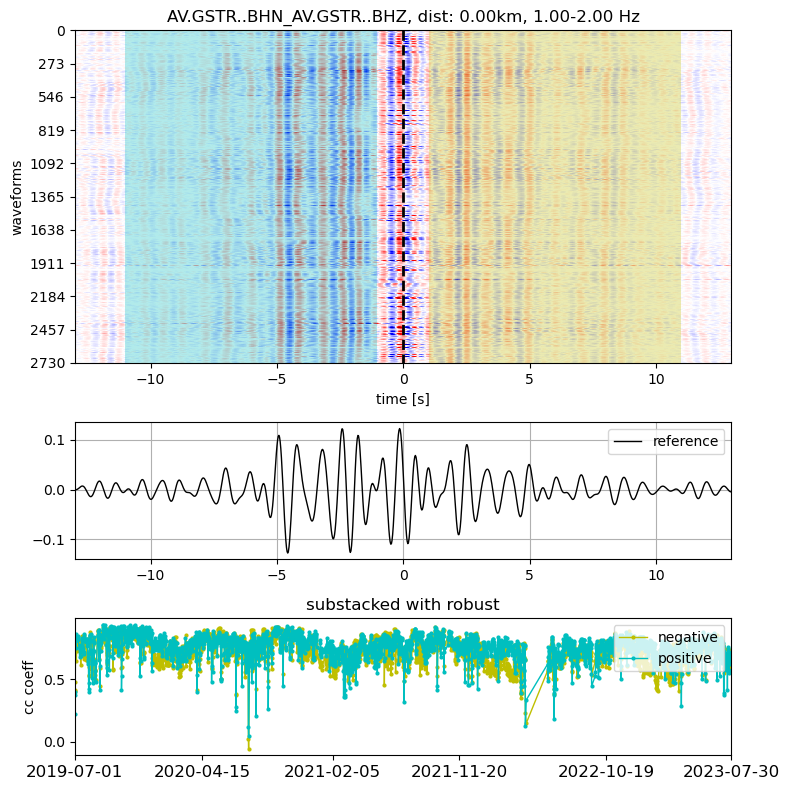

with 20 processors, took 14.660590 seconds
Time! Total Time: 729.0108375549316


In [10]:
print('Timer on!')
print()
t0=time.time()

for sta in sta_list:
    for comp in cc_complist:
        for freq in freqlst:
            offset = 1/freq[0]                            #offset
            coda_wlen = window_factor/freq[0]                           #window length in seconds for the coda waves 

            freq = freq
            source = sta
            receiver = source
            cc_comp = comp

            #file handling#
            key=source+'_'+receiver
            ccfile=sorted(glob.glob(os.path.join(direc,source,'*'+receiver+'*.h5')))[0]
            corrdata0=noise.extract_corrdata(ccfile,pair=source+'_'+receiver,comp=cc_comp)
#                 lat = corrdata0.lat
#                 lon = corrdata0.lon

            #print(corrdata0['AV.GSSP_AV.GSSP']['EZ'].data[0])

            ##########NaN Slice Removal#####################
            newcorrdata = corrdata0.copy()

            ncorrdata = newcorrdata[key][cc_comp]

            newtime = []
            newdata= [] 

            for i,d in enumerate(ncorrdata.data): 
                if not np.isnan(d).any(): 
                    newtime.append(ncorrdata.time[i])
                    newdata.append(d)

            ncorrdata.time = np.array(newtime)
            ncorrdata.data = np.array(newdata)
            print(len(ncorrdata.time))
            print(len(ncorrdata.data))
            ############################################


            ##REFERENCE DATA
            #cdataref=corrdata[key][cc_comp]
            cdataref=ncorrdata.copy()
            
            cdataref.subset(starttime=sdateref,endtime=edateref, overwrite = True)
            ref=seisstack(cdataref.data,method=stack_method)


            ##FULL DATA SET DURATION##
            #cdata=corrdata[key][cc_comp]
            cdata=ncorrdata
            cdata.subset(starttime=sdate,endtime=edate, overwrite = True)

            #HIGH FREQUENCY (FULL DURATION)
            #freq = freqrange                             #targeted frequency band for monitoring
            win_len0 = 3600*12                           #Window length i.e. Resolution
            dv_max = 8/100                             #limit for the dv/v
            cdata.plot(freqmin=freq[0],freqmax=freq[1], lag = coda_wlen+5, stack_method = stack_method)
            t1=time.time()
            filename = 'dvv.'+source+'.'+receiver+'.'+cc_comp+'.'+'redo'+'.'+str(freq[0])+'-'+str(freq[1])+'Hz'+'.'+Method+'.pk'
            #'dvv.'+source+'.'+receiver+'.'+cc_comp+'.'+str(offset)+'.'+str(coda_wlen)+'.'+str(freq[0])+'-'+str(freq[1])+'Hz'+'.'+Method+'.pk'
            print('saving as: '+filename)
            dvvdata=monitoring.get_dvv(cdata,freq,coda_wlen,resolution=win_len0,vmin=vmin,ref = ref, method = Method, \
                                                whiten ='no',whiten_pad= 100,whiten_smooth=20,\
                                                stack_method=stack_method,plot=True,nproc=nproc, save=True, format='pickle',\
                                                outdir=dvvdir,outfile = filename, dvmax=dv_max, offset=offset)
            print("with %d processors, took %f seconds"%(nproc,time.time()-t1))

print('=============================')
print('Time! Total Time: '+str(time.time()-t0))